# FIMO global 2

We will focus on looking at some othe rkey motifs and also doing this PCA idea suggested by alireza

In [2]:
#let's try the PCA idea to get an idea of the timing, let's just do one celltype for now
import numpy as np
load = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_summary_bothmodel.npz')
fimo_summary,fimo_summary_mult = load['fimo_summary'], load['fimo_summary_mult']
print(fimo_summary.shape, fimo_summary_mult.shape)

(9999, 572, 161) (9999, 572, 161)


In [4]:
#so the idea is use PCA to reduce that space of it
#let's turn it from 3d to 2d by compressing the last 2 dimensions
fimo_flattened = fimo_summary.reshape(9999,-1)
print(fimo_flattened.shape)
#flattens it such that all the 161 celltypes of each motif are put together! This would make sense!

(9999, 92092)


In [5]:
#now we can easily use PCA and reduce it down to 100 dimensions
from sklearn.decomposition import PCA
pca = PCA(n_components=100)
fimo_pca = pca.fit_transform(fimo_flattened)
print(fimo_pca.shape)

(9999, 100)


In [6]:
#now let's do a umap and plot it
import umap
reducer = umap.UMAP()
fimo_umap = reducer.fit_transform(fimo_pca)
print(fimo_umap.shape)

(9999, 2)


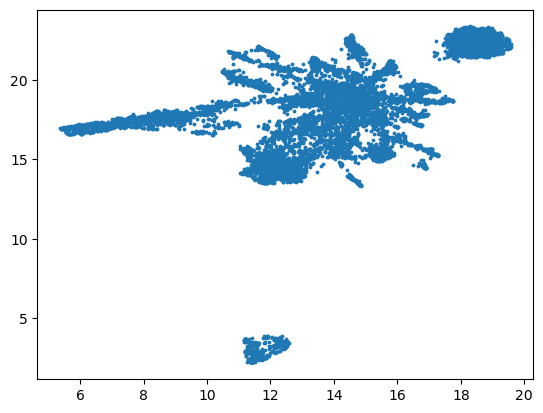

In [8]:
#now let's plot it
import matplotlib.pyplot as plt
plt.scatter(fimo_umap[:,0], fimo_umap[:,1], s = 3)

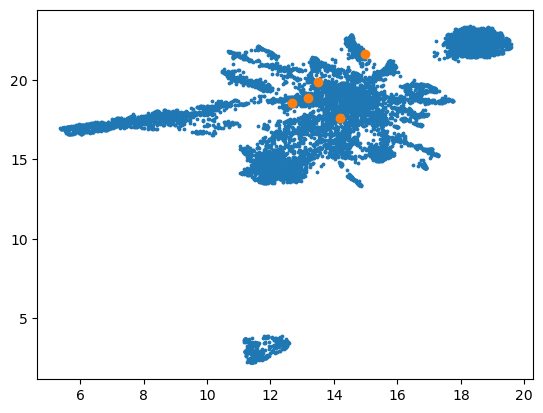

In [9]:
#let's go ahead and plot the ones we all found to be similar for NFKB, see if they're together at least
#350+36 and 350+36+5 and 2110 and 2113 and 2113+20
plt.scatter(fimo_umap[:,0], fimo_umap[:,1], s = 3)
NFKB_motifs = [350+36,350+36+5,2110,2113,2113+20]
plt.scatter(fimo_umap[NFKB_motifs,0], fimo_umap[NFKB_motifs,1])
#we'd hope that at least these are similar...

In [10]:
#if that doesn't work, we will first scale our data then do pca and see if that's any better!
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled = scaler.fit_transform(fimo_flattened)
pca = PCA(n_components=100)
fimo_pca = pca.fit_transform(scaled)
print(fimo_pca.shape)

(9999, 100)


In [11]:
import umap
reducer = umap.UMAP()
fimo_umap = reducer.fit_transform(fimo_pca)
print(fimo_umap.shape)

(9999, 2)


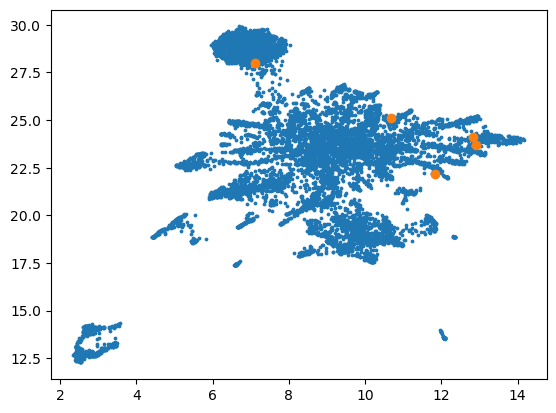

In [12]:
#let's go ahead and plot the ones we all found to be similar for NFKB, see if they're together at least
#350+36 and 350+36+5 and 2110 and 2113 and 2113+20
plt.scatter(fimo_umap[:,0], fimo_umap[:,1], s = 3)
NFKB_motifs = [350+36,350+36+5,2110,2113,2113+20]
plt.scatter(fimo_umap[NFKB_motifs,0], fimo_umap[NFKB_motifs,1])
#we'd hope that at least these are similar...

#this is even worse lmao!

(9999, 2)


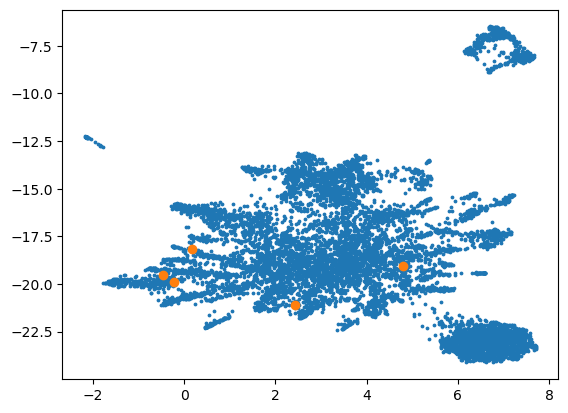

In [15]:
import umap
reducer = umap.UMAP(min_dist=0.15, n_neighbors=20)
fimo_umap = reducer.fit_transform(fimo_pca)
print(fimo_umap.shape)
#let's go ahead and plot the ones we all found to be similar for NFKB, see if they're together at least
#350+36 and 350+36+5 and 2110 and 2113 and 2113+20
plt.scatter(fimo_umap[:,0], fimo_umap[:,1], s = 3)
NFKB_motifs = [350+36,350+36+5,2110,2113,2113+20]
plt.scatter(fimo_umap[NFKB_motifs,0], fimo_umap[NFKB_motifs,1])
#we'd hope that at least these are similar...

#this is even worse lmao!

In [16]:
#if that doesn't work, we will first scale our data then do pca and see if that's any better!
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled = scaler.fit_transform(fimo_flattened)
pca = PCA(n_components=50)
fimo_pca = pca.fit_transform(scaled)
print(fimo_pca.shape)

(9999, 50)


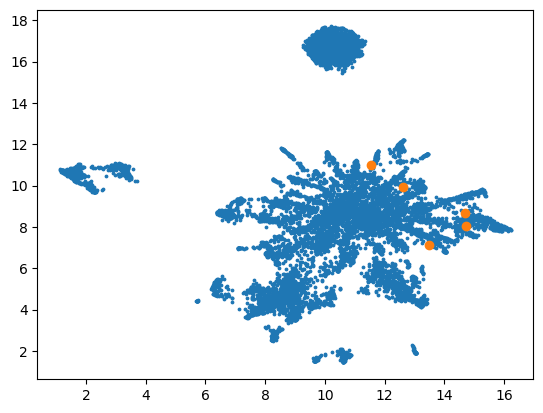

In [18]:
#let's go ahead and plot the ones we all found to be similar for NFKB, see if they're together at least
#350+36 and 350+36+5 and 2110 and 2113 and 2113+20
reducer = umap.UMAP()
fimo_umap = reducer.fit_transform(fimo_pca)
plt.scatter(fimo_umap[:,0], fimo_umap[:,1], s = 3)
NFKB_motifs = [350+36,350+36+5,2110,2113,2113+20]
plt.scatter(fimo_umap[NFKB_motifs,0], fimo_umap[NFKB_motifs,1])
#we'd hope that at least these are similar...

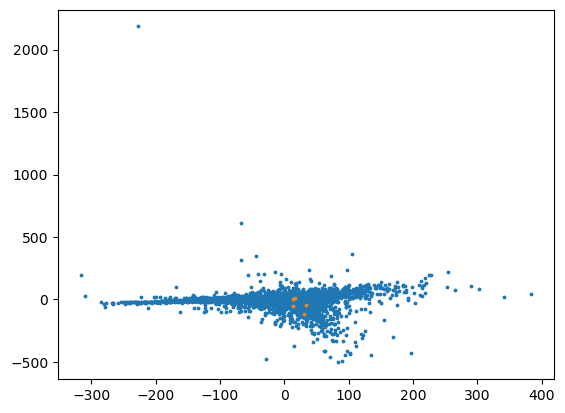

In [23]:
#let's just plot the pca plot
plt.scatter(fimo_pca[:,0], fimo_pca[:,1], s=3)
plt.scatter(fimo_pca[NFKB_motifs,0], fimo_pca[NFKB_motifs,1], s=3)

# now back to analyzing independent known motifs!

In [20]:
#we'll look at the GATA ones again
#let's try GATA 3
#let's load our saved file
import numpy as np
load = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_summary_bothmodel.npz')
fimo_summary,fimo_summary_mult = load['fimo_summary'], load['fimo_summary_mult']
print(fimo_summary.shape, fimo_summary_mult.shape)
import matplotlib.pyplot as plt
import seaborn as sns

(9999, 572, 161) (9999, 572, 161)


In [21]:
#it is based on elements of train_idx, so to figure it out, load in train idx
train_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/train_idx.npy')
train_idx = train_idx[train_idx != 752763]
#now let's plot it
from shap_analysis.ism_utils import *
multitasking_path1 = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-27/18-39-11-031863/checkpoints/25-val_loss=0.52186.ckpt' #the 25 epoch one
ctst_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-25/15-41-13-286486/checkpoints/last.ckpt'
mult = ISMUtils('DNase_allcelltypes', multitasking_path1, classification=True)
ctst = ISMUtils('DNase_ctst', ctst_path, classification=True)

In [22]:
#now have to load in the datafram to see where it is!
import numpy as np
def fimo_ccre_summary(idx, model_type, split, pad_num = 5):
    #this is the function that for a single ccre produces the FIMO summary for every motif in the cCRE
    #this function takes in the index, model type, and the split, from it, it shows how the fimo highest attributions compare
    ccre_summary = np.zeros((572, 161), dtype=np.float32)
    train_df = fimo_results.filter(pl.col('sequence_name') == f'train{idx}')
    # print(train_df.shape) #it's consistent because it's the first one as before! 170 is the number of motifs
    motifs = train_df[['motif_id','start','stop']].to_numpy()
    motifs[:,1] -= extra_pad
    motifs[:,2] += extra_pad
    np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
    np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])

    #ONLY IF CTST!!!!!
    
    if model_type == 'ctst':
        ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/ctst_bestepoch_{idx}_reg.npy')
        tempism = ism.mean(0)[1:]
    elif model_type == 'multitasking':
        ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/multitasking_25epoch_{idx}_reg.npy')
        tempism = ism.mean(0)
    else:
        raise ValueError('Model type not recognized')

    for i in range(motifs.shape[0]):
        #now we go through and we will find the average value of the ISM for this motif
        start = int(motifs[i,1])
        stop = int(motifs[i,2])
        average_vals = np.mean(tempism[start:stop, :], axis=0) #averages over the whole region keeping each celltype separate!
        #if it's higher than the sum of the current one (in absolute value). will if 0, or if multiple of that motif, chooses biggest one
        if abs(ccre_summary[motif_dict[motifs[i,0]],:]).sum() < abs(average_vals).sum():
            ccre_summary[motif_dict[motifs[i,0]], :] = average_vals
    return ccre_summary
#this is then integrated as fimo_summary[j]
#we need to make our dictionary as well
#let's make this a proper loop and figure out what we're doing
import numpy as np
train_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/train_idx.npy')
val_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/val_idx.npy')
test_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/test_idx.npy')

#remove the 752763 index from train_idx
train_idx = train_idx[train_idx != 752763]

import polars as pl
fimo_results = pl.read_csv('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_motifs/fimo.tsv', separator = '\t')

fimo_results = fimo_results.drop(['motif_alt_id', 'string'])
fimo_results = fimo_results[:-3]

#this is just the loading of the data

#and now some preprocessing

extra_pad = 5
all_motifs = fimo_results.group_by('motif_id').agg().sort('motif_id')
all_motifs = all_motifs.to_numpy()
motif_dict = {}
counter = 0
for motif in all_motifs:
    motif_dict[motif[0]] = counter
    counter += 1

In [24]:
temp = fimo_summary[:,156,:]
mask = temp.sum(1) != 0
mask = np.where(mask)[0]
print(a:=mask[423])
print(train_idx[a])

2102
771619


[['GATA2_MA0036.3' 534 554]]


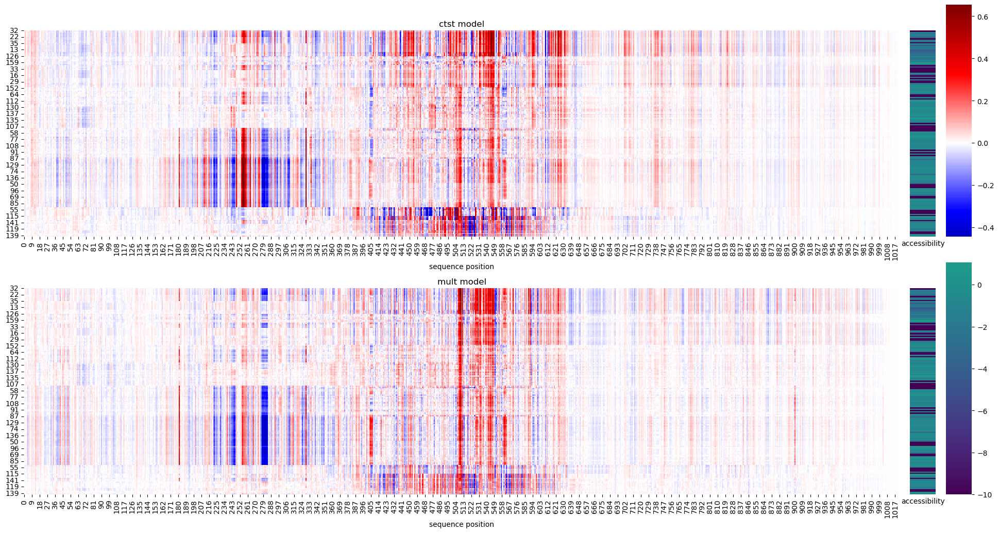

In [27]:
idx = 771619
split = 'train'
filename = 'ctst_bestepoch'
filename_mult = 'multitasking_25epoch'
ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename}_{idx}_reg.npy')
ism_mult = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename_mult}_{idx}_reg.npy')
true_values = mult.dataset[idx][1][1]
multi_cluster([ism,ism_mult], true_values, ['ctst', 'mult'], utils_list = [ctst,mult])
#on this example multitasking appears more cel type specific, but hard to tell what is actually meaningful!
#and of course find the start and stop regions, use the same cells tho for reference
train_df = fimo_results.filter(pl.col('sequence_name') == f'train{idx}')
train_df.head()
motifs = train_df[['motif_id','start','stop']].to_numpy()
motifs[:,1] -= extra_pad
motifs[:,2] += extra_pad
np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])
#find all motifs[:,0] that are NFKB1_MA0105.4
nfk = motifs[motifs[:,0] == 'GATA2_MA0036.3']
# print(motifs)
print(nfk) #wait why is this empty?

(<Figure size 1500x4800 with 32 Axes>,
 array([[<Axes: title={'center': 'GM12891, true=-10.0'}>,
         <Axes: title={'center': 'GM12891, true=-10.0'}>],
        [<Axes: title={'center': 'GM13977, true=-3.958430051803589'}>,
         <Axes: title={'center': 'GM13977, true=-3.958430051803589'}>],
        [<Axes: title={'center': 'GM12878, true=-10.0'}>,
         <Axes: title={'center': 'GM12878, true=-10.0'}>],
        [<Axes: title={'center': 'HuH-7, true=-0.6817733645439148'}>,
         <Axes: title={'center': 'HuH-7, true=-0.6817733645439148'}>],
        [<Axes: title={'center': 'DND-41, true=-10.0'}>,
         <Axes: title={'center': 'DND-41, true=-10.0'}>],
        [<Axes: title={'center': 'HL-60, true=-1.5166232585906982'}>,
         <Axes: title={'center': 'HL-60, true=-1.5166232585906982'}>],
        [<Axes: title={'center': 'neural_crest_cell, true=-10.0'}>,
         <Axes: title={'center': 'neural_crest_cell, true=-10.0'}>],
        [<Axes: title={'center': 'GM19239, true=-1

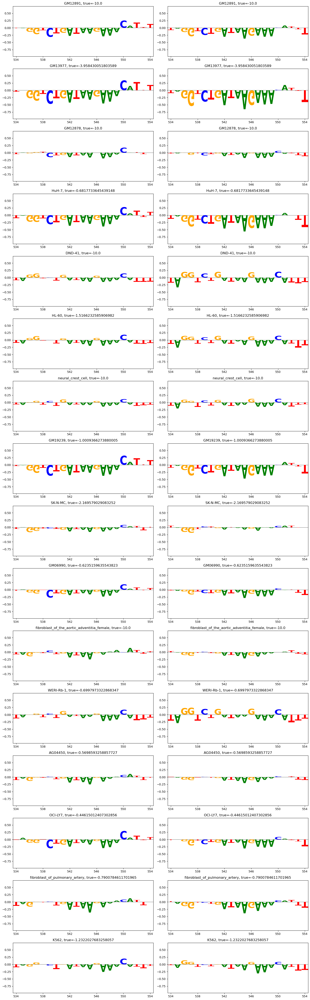

In [29]:
start = 534
end = 555
cell_idxs = [11, 14, 54, 24, 156, 154, 153, 17, 95, 51, 43, 114, 39, 137, 74, 83]
celltype_compare_logo([mult,ctst],idx, cell_idxs, [ism_mult.sum(0), ism.sum(0)], startend=(start,end), true_values = true_values)
#this is the GATA2 motif, and we can see it's very negative, want to look for positive ones, let's try gata 3

In [31]:
#ok there's a lot of GATA motifs, Gata1-3 are apparently important, let's look for any consistent patterns in GATA
motif_dict['GATA3_MA0037.3']

157

<Axes: >

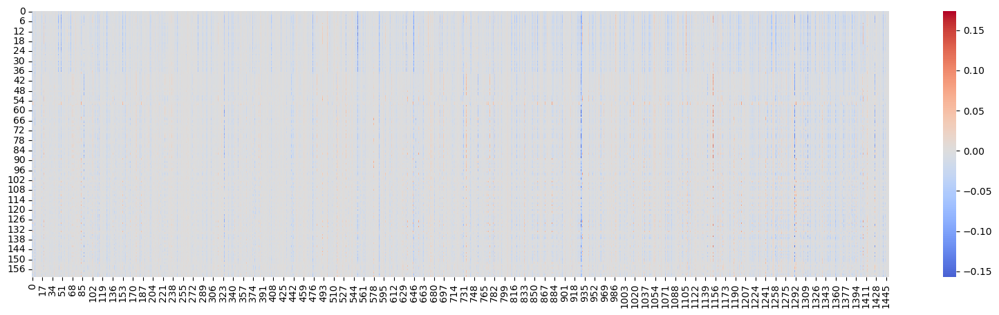

In [32]:
#so it's 156, let's check that from fimo dict
temp = fimo_summary[:,157,:]
#and plot
temp = temp[temp.sum(1) != 0]
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(-temp.T,cmap='coolwarm',ax=ax, center=0)
#I see one that is positive and one that is negative, let's look at them both, there's at least a second one that is also negative


<Axes: >

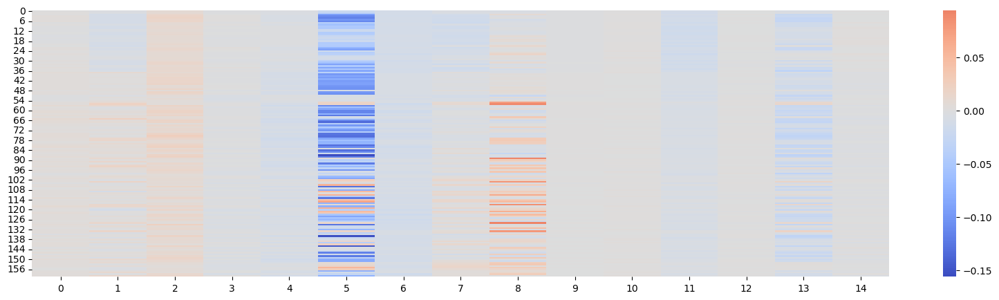

In [33]:
#so it's 156, let's check that from fimo dict
temp = fimo_summary[:,157,:]
#and plot
temp = temp[temp.sum(1) != 0]
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(-temp[1285:1300].T,cmap='coolwarm',ax=ax, center=0)
#I see one that is positive and one that is negative, let's look at them both, there's at least a second one that is also negative
#other region is around 1150

In [34]:
#1290 does look interesting even if it's wrong about the k562 cells
temp = fimo_summary[:,157,:]
mask = temp.sum(1) != 0
mask = np.where(mask)[0]
print(a:=mask[1290])
print(train_idx[a])

7410
605856


[['GATA3_MA0037.3' 542 559]]


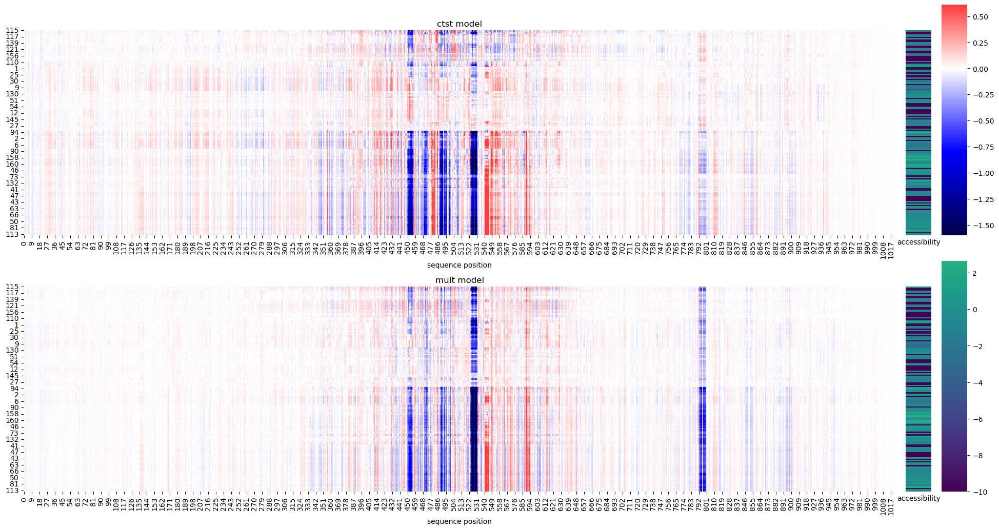

In [35]:
idx = 605856
ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename}_{idx}_reg.npy')
ism_mult = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename_mult}_{idx}_reg.npy')
true_values = mult.dataset[idx][1][1]
multi_cluster([ism,ism_mult], true_values, ['ctst', 'mult'], utils_list = [ctst,mult])
#on this example multitasking appears more cel type specific, but hard to tell what is actually meaningful!
#and of course find the start and stop regions, use the same cells tho for reference
train_df = fimo_results.filter(pl.col('sequence_name') == f'train{idx}')
train_df.head()
motifs = train_df[['motif_id','start','stop']].to_numpy()
motifs[:,1] -= extra_pad
motifs[:,2] += extra_pad
np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])
#find all motifs[:,0] that are NFKB1_MA0105.4
nfk = motifs[motifs[:,0] == 'GATA3_MA0037.3']
# print(motifs)
print(nfk) #wait why is this empty?

(<Figure size 1500x4800 with 32 Axes>,
 array([[<Axes: title={'center': 'GM12891, true=-10.0'}>,
         <Axes: title={'center': 'GM12891, true=-10.0'}>],
        [<Axes: title={'center': 'GM13977, true=-2.052475929260254'}>,
         <Axes: title={'center': 'GM13977, true=-2.052475929260254'}>],
        [<Axes: title={'center': 'GM12878, true=-1.6516062021255493'}>,
         <Axes: title={'center': 'GM12878, true=-1.6516062021255493'}>],
        [<Axes: title={'center': 'HuH-7, true=-1.5034198760986328'}>,
         <Axes: title={'center': 'HuH-7, true=-1.5034198760986328'}>],
        [<Axes: title={'center': 'DND-41, true=-10.0'}>,
         <Axes: title={'center': 'DND-41, true=-10.0'}>],
        [<Axes: title={'center': 'HL-60, true=-2.0517630577087402'}>,
         <Axes: title={'center': 'HL-60, true=-2.0517630577087402'}>],
        [<Axes: title={'center': 'neural_crest_cell, true=-10.0'}>,
         <Axes: title={'center': 'neural_crest_cell, true=-10.0'}>],
        [<Axes: title=

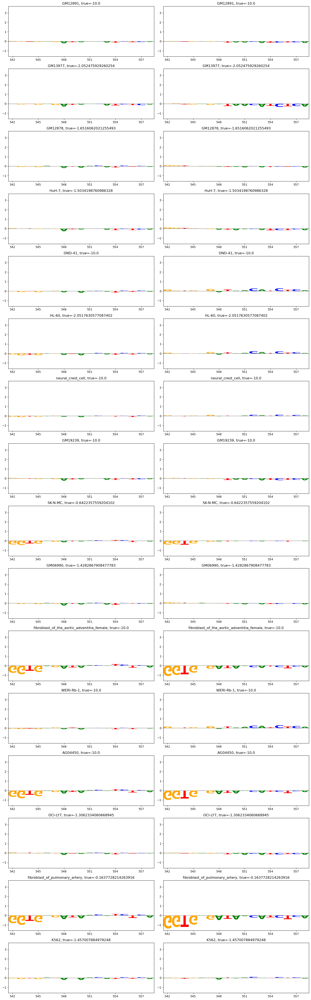

In [36]:
#seems like it's something else actually, also what is that one around 790, only positive for one but positive and negative for other
start = 542
end = 559
cell_idxs = [11, 14, 54, 24, 156, 154, 153, 17, 95, 51, 43, 114, 39, 137, 74, 83]
celltype_compare_logo([mult,ctst],idx, cell_idxs, [ism_mult.sum(0), ism.sum(0)], startend=(start,end), true_values = true_values)
#this is the GATA2 motif, and we can see it's very negative, want to look for positive ones, let's try gata 3

In [37]:
#this isn't actually relevant at all...
#there's one last one, Gata1_MA0035.3
motif_dict['Gata1_MA0035.3']

176

<Axes: >

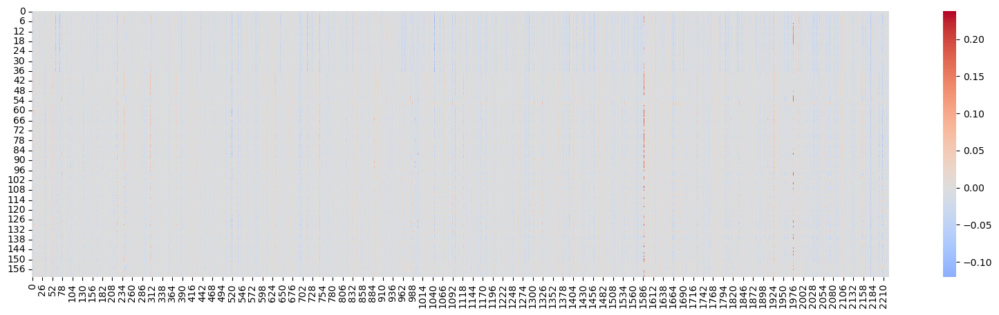

In [38]:
#so it's 156, let's check that from fimo dict
temp = fimo_summary[:,176,:]
#and plot
temp = temp[temp.sum(1) != 0]
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(-temp.T,cmap='coolwarm',ax=ax, center=0)
#I see one that is positive and one that is negative, let's look at them both, there's at least a second one that is also negative


In [39]:
#let's not look for SPI1
dict_list = list(motif_dict.keys())
for i in dict_list:
    if 'spi1' in i.lower():
        print(i)

SPI1_MA0080.4


In [40]:
motif_dict['SPI1_MA0080.4']

466

<Axes: >

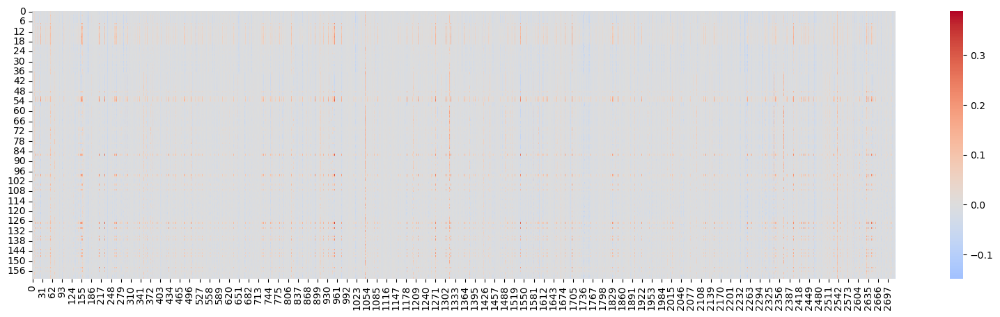

In [41]:
#so it's 156, let's check that from fimo dict
temp = fimo_summary[:,466,:]
#and plot
temp = temp[temp.sum(1) != 0]
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(-temp.T,cmap='coolwarm',ax=ax, center=0)
#I see one that is positive and one that is negative, let's look at them both, there's at least a second one that is also negative
#this one seems to obviously be really solid, lots of patterns that stretch into the GM and known B cells

<Axes: >

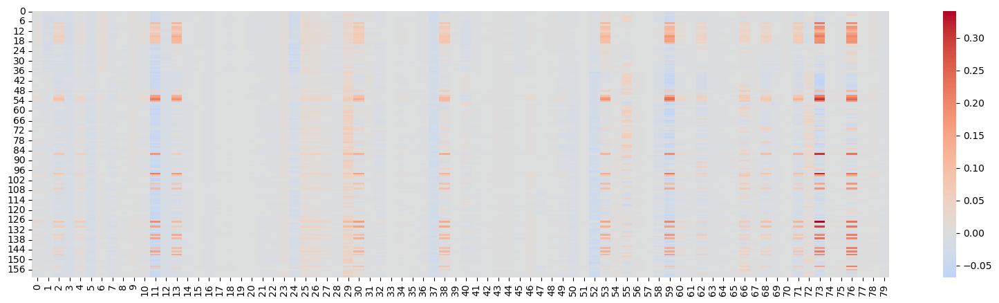

In [42]:
#so it's 156, let's check that from fimo dict
temp = fimo_summary[:,466,:]
#and plot
temp = temp[temp.sum(1) != 0]
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(-temp[880:960].T,cmap='coolwarm',ax=ax, center=0)
#I see one that is positive and one that is negative, let's look at them both, there's at least a second one that is also negative
#this one seems to obviously be really solid, lots of patterns that stretch into the GM and known B cells

2710
301475
[['SPI1_MA0080.4' 499 522]
 ['SPI1_MA0080.4' 106 129]
 ['SPI1_MA0080.4' 717 740]]


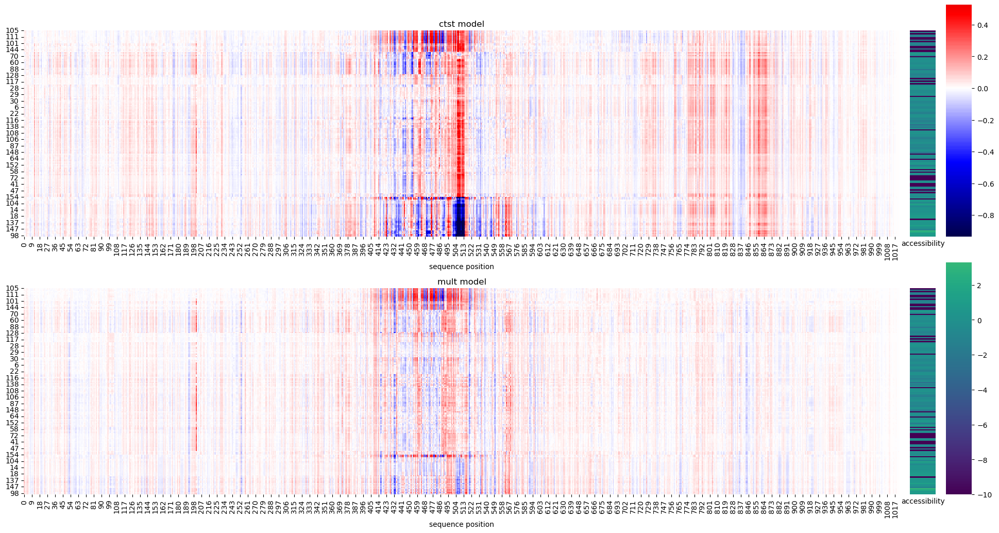

In [44]:
#let's try 891
#1290 does look interesting even if it's wrong about the k562 cells
temp = fimo_summary[:,466,:]
mask = temp.sum(1) != 0
mask = np.where(mask)[0]
print(a:=mask[891])
print(idx:=train_idx[a])
ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename}_{idx}_reg.npy')
ism_mult = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename_mult}_{idx}_reg.npy')
true_values = mult.dataset[idx][1][1]
multi_cluster([ism,ism_mult], true_values, ['ctst', 'mult'], utils_list = [ctst,mult])
#on this example multitasking appears more cel type specific, but hard to tell what is actually meaningful!
#and of course find the start and stop regions, use the same cells tho for reference
train_df = fimo_results.filter(pl.col('sequence_name') == f'train{idx}')
train_df.head()
motifs = train_df[['motif_id','start','stop']].to_numpy()
motifs[:,1] -= extra_pad
motifs[:,2] += extra_pad
np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])
#find all motifs[:,0] that are NFKB1_MA0105.4
nfk = motifs[motifs[:,0] == 'SPI1_MA0080.4']
# print(motifs)
print(nfk) #wait why is this empty?

(<Figure size 1500x4800 with 32 Axes>,
 array([[<Axes: title={'center': 'GM12891, true=0.5890241265296936'}>,
         <Axes: title={'center': 'GM12891, true=0.5890241265296936'}>],
        [<Axes: title={'center': 'GM13977, true=0.2941592037677765'}>,
         <Axes: title={'center': 'GM13977, true=0.2941592037677765'}>],
        [<Axes: title={'center': 'GM12878, true=0.30107614398002625'}>,
         <Axes: title={'center': 'GM12878, true=0.30107614398002625'}>],
        [<Axes: title={'center': 'HuH-7, true=0.3123784363269806'}>,
         <Axes: title={'center': 'HuH-7, true=0.3123784363269806'}>],
        [<Axes: title={'center': 'DND-41, true=-10.0'}>,
         <Axes: title={'center': 'DND-41, true=-10.0'}>],
        [<Axes: title={'center': 'HL-60, true=0.01144696306437254'}>,
         <Axes: title={'center': 'HL-60, true=0.01144696306437254'}>],
        [<Axes: title={'center': 'neural_crest_cell, true=-10.0'}>,
         <Axes: title={'center': 'neural_crest_cell, true=-10.0'}>]

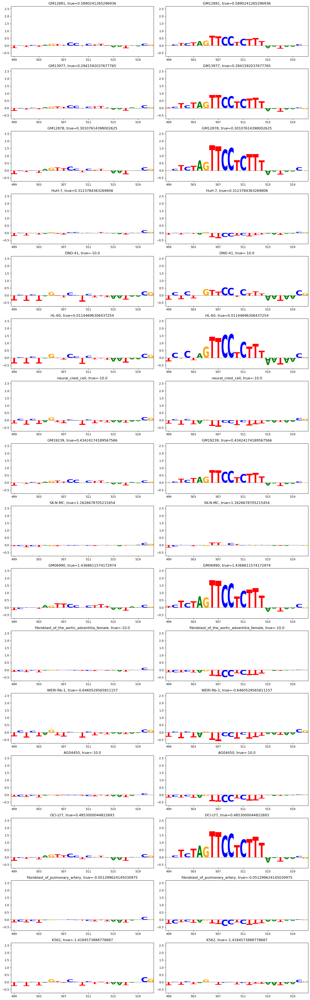

In [45]:
#seems like it's something else actually, also what is that one around 790, only positive for one but positive and negative for other
start = 499
end = 522
cell_idxs = [11, 14, 54, 24, 156, 154, 153, 17, 95, 51, 43, 114, 39, 137, 74, 83]
celltype_compare_logo([mult,ctst],idx, cell_idxs, [ism_mult.sum(0), ism.sum(0)], startend=(start,end), true_values = true_values)
#this is the GATA2 motif, and we can see it's very negative, want to look for positive ones, let's try gata 3

# amazing findings!!

In [ ]:
#literally just asked chat gpt and the results are consistent
#HL-60 is a myeloid leukemia and expect it to be involved in that, but not at all in fibroblasts!
#actually very happy with the results

#and oci ly7 is a B cell lymphoma

#we could always look at more of these SPI1 examples!
#also this seems to be the reverse complement, but that's find because the other strand has the main motif I guess
#the direction 5' to 3' does really matter, reverse not complement is not considered an instance of that motif

In [1]:
#let's produce a figure quality heatmap comparing the models, then we can show these examples to show how it doesn't capture known motifs for B cells: SPI1
#we'll look at the GATA ones again
#let's try GATA 3
#let's load our saved file
import numpy as np
load = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_summary_bothmodel.npz')
fimo_summary,fimo_summary_mult = load['fimo_summary'], load['fimo_summary_mult']
print(fimo_summary.shape, fimo_summary_mult.shape)
import matplotlib.pyplot as plt
import seaborn as sns
#it is based on elements of train_idx, so to figure it out, load in train idx
#now let's plot it
from shap_analysis.ism_utils import *
multitasking_path1 = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-27/18-39-11-031863/checkpoints/25-val_loss=0.52186.ckpt' #the 25 epoch one
ctst_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-25/15-41-13-286486/checkpoints/last.ckpt'
mult = ISMUtils('DNase_allcelltypes', multitasking_path1, classification=True)
ctst = ISMUtils('DNase_ctst', ctst_path, classification=True)
#now have to load in the datafram to see where it is!
import numpy as np
train_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/train_idx.npy')
val_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/val_idx.npy')
test_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/test_idx.npy')

#remove the 752763 index from train_idx
train_idx = train_idx[train_idx != 752763]

import polars as pl
fimo_results = pl.read_csv('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_motifs/fimo.tsv', separator = '\t')

fimo_results = fimo_results.drop(['motif_alt_id', 'string'])
fimo_results = fimo_results[:-3]

#this is just the loading of the data

#and now some preprocessing

extra_pad = 5
all_motifs = fimo_results.group_by('motif_id').agg().sort('motif_id')
all_motifs = all_motifs.to_numpy()
motif_dict = {}
counter = 0
for motif in all_motifs:
    motif_dict[motif[0]] = counter
    counter += 1

(9999, 572, 161) (9999, 572, 161)


<Axes: >

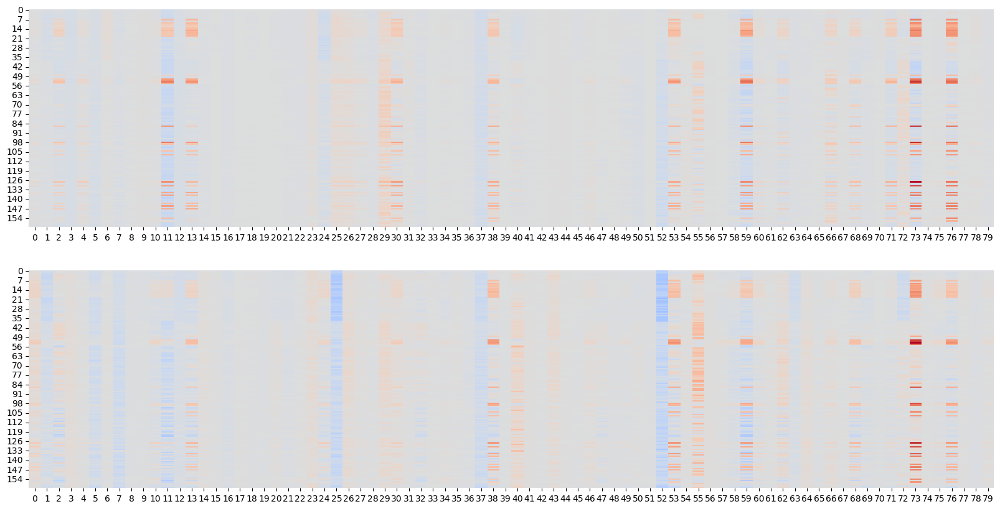

In [13]:
#let's go ahead and now plot the heatmap
temp = fimo_summary[:,466,:]
temp = temp[temp.sum(1) != 0]
fig, ax = plt.subplots(2,1,figsize=(20,10))
sns.heatmap(-temp[880:960].T,cmap='coolwarm',ax=ax[0], center=0, cbar=None)
temp2 = fimo_summary_mult[:,466,:]
temp2 = temp2[temp2.sum(1) != 0]
sns.heatmap(-temp2[880:960].T,cmap='coolwarm',ax=ax[1], center=0, cbar=None)

#uh oh, this muddles the story a bit, it seems like there's some CREs where it is about as good, but others where it's terrible
#we just happened to choose one where it's very bad
#stil seems more cell type specific in general!
#but, it's not less clear on how to easily plot this or show the difference

In [16]:
#we can actually interpret this easier with the UMAP lmao, let's do the UMAP and plot all these points, specifically see if they're close
#and if they are, then see, wait this doens't show one model is better or worse, because it's based on attributions anyways
#would have to check those individual CREs, idk kif I like this visualization anymore, makes it a bit questionable...
#still, l et's check to see it on the UMAP
#we now need to find the corresponding indices for the SPI1 motif
mask = fimo_summary[:,466,:].sum(1) != 0
print(mask.shape)
#now we index into this
indices = np.array([2,4,11,13,30,38,53,59,66,68,71,73,76])+880
#now to find our indices in our original data, we use the mask
indices = np.where(mask)[0][indices]
print(indices.shape, indices)

(9999,)
(13,) [2687 2689 2710 2713 2756 2780 2827 2845 2858 2861 2873 2879 2889]


(9999, 100)
(9999, 2)


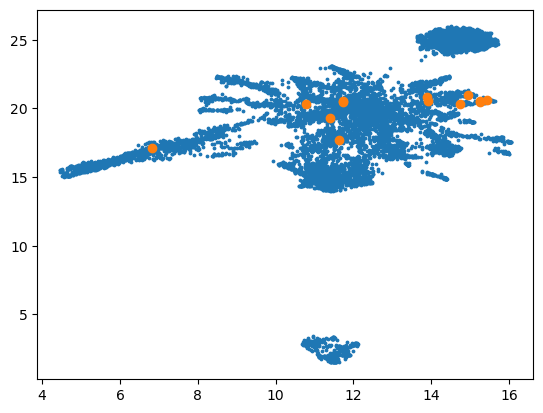

In [17]:
#now we can easily use PCA and reduce it down to 100 dimensions
fimo_flattened = fimo_summary.reshape(9999,-1)
from sklearn.decomposition import PCA
pca = PCA(n_components=100)
fimo_pca = pca.fit_transform(fimo_flattened)
print(fimo_pca.shape)
#now let's do a umap and plot it
import umap
reducer = umap.UMAP()
fimo_umap = reducer.fit_transform(fimo_pca)
print(fimo_umap.shape)
#now let's plot it
import matplotlib.pyplot as plt
plt.scatter(fimo_umap[:,0], fimo_umap[:,1], s = 3)
plt.scatter(fimo_umap[indices,0],fimo_umap[indices,1])

(array([7.458e+03, 3.950e+02, 3.080e+02, 2.500e+02, 2.010e+02, 1.580e+02,
        1.440e+02, 1.230e+02, 1.040e+02, 9.700e+01, 9.000e+01, 7.100e+01,
        7.100e+01, 5.900e+01, 4.400e+01, 3.500e+01, 4.400e+01, 3.600e+01,
        2.400e+01, 3.000e+01, 2.800e+01, 1.800e+01, 1.900e+01, 1.900e+01,
        1.000e+01, 9.000e+00, 1.700e+01, 1.500e+01, 1.100e+01, 1.500e+01,
        1.200e+01, 4.000e+00, 3.000e+00, 1.300e+01, 5.000e+00, 4.000e+00,
        3.000e+00, 5.000e+00, 7.000e+00, 5.000e+00, 3.000e+00, 3.000e+00,
        2.000e+00, 2.000e+00, 2.000e+00, 3.000e+00, 0.000e+00, 0.000e+00,
        4.000e+00, 2.000e+00, 1.000e+00, 0.000e+00, 1.000e+00, 0.000e+00,
        1.000e+00, 1.000e+00, 0.000e+00, 1.000e+00, 2.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 1.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+0

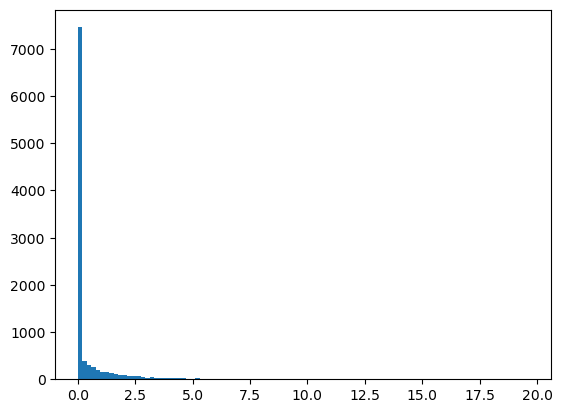

In [19]:
#let's set some sort of threshold
temp = fimo_summary[:,466,:]
#let's look at the distribution
plt.hist(np.abs(temp).sum(1), bins = 100)
# temp = temp[temp.sum(1) > 2]
# fig, ax = plt.subplots(figsize=(20,5))
# sns.heatmap(-temp.T,cmap='coolwarm',ax=ax, center=0)

<Axes: >

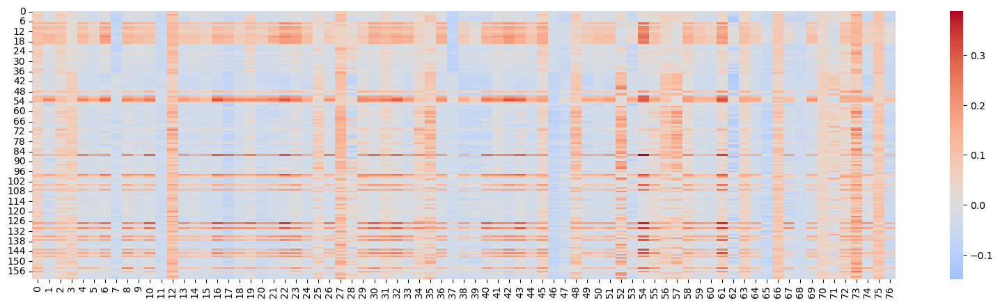

In [32]:
#let's set some sort of threshold
temp = fimo_summary[:,466,:]
#let's look at the distribution
mask = np.abs(temp).sum(1) > 6.5
temp = temp[mask]
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(-temp.T,cmap='coolwarm',ax=ax, center=0)

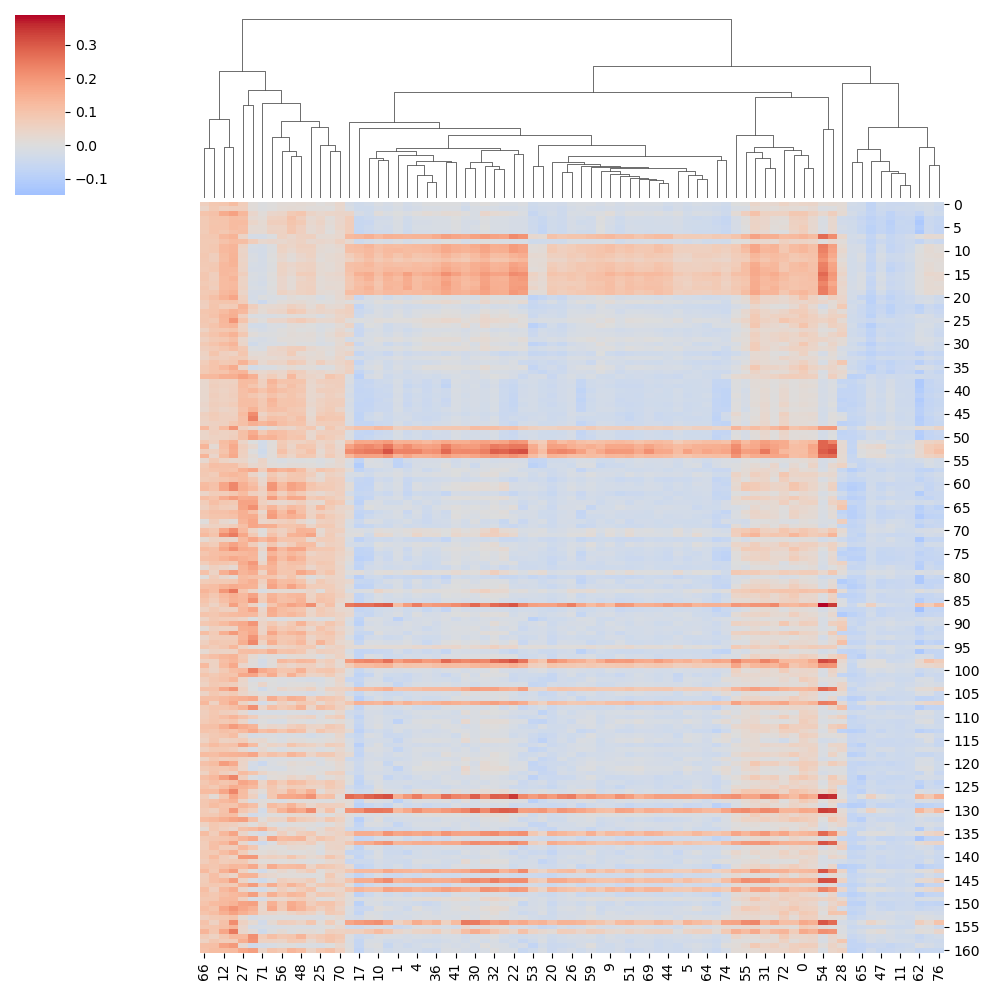

In [33]:
#let's set some sort of threshold
temp = fimo_summary[:,466,:]
#let's look at the distribution
mask = np.abs(temp).sum(1) > 6.5
temp = temp[mask]
sns.clustermap(-temp.T,cmap='coolwarm', center=0, row_cluster = False)

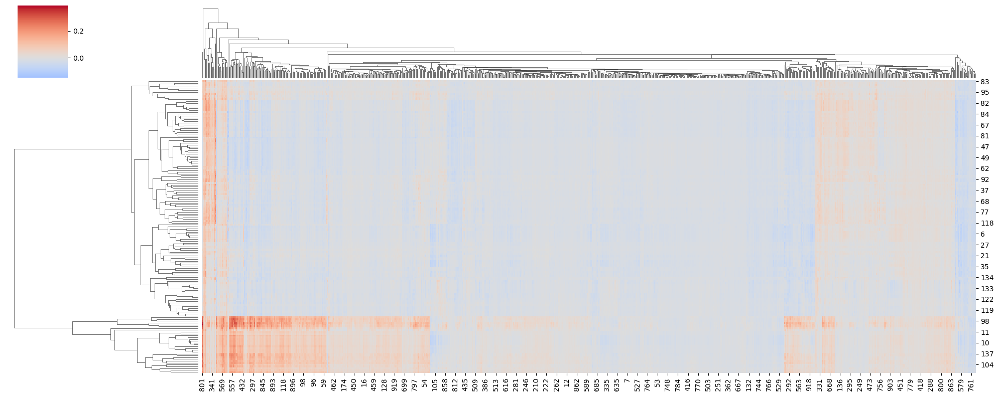

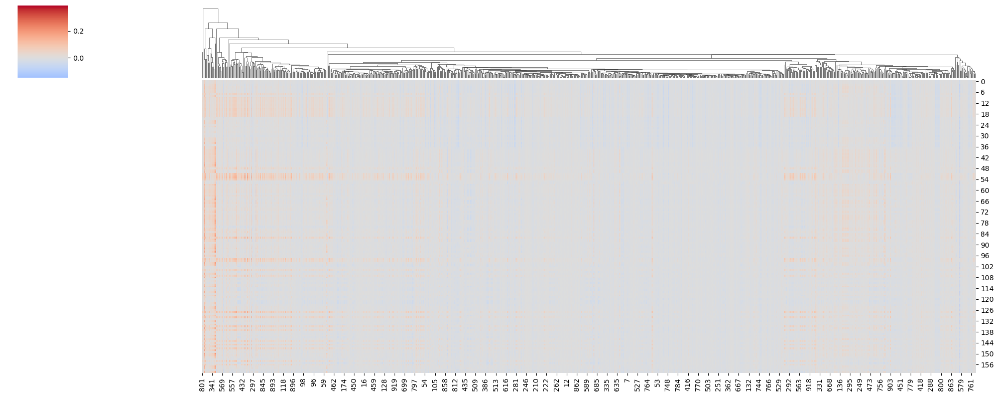

In [41]:
#let's set some sort of threshold
temp = fimo_summary[:,466,:]
#let's look at the distribution
mask = np.abs(temp).sum(1) > 1.5
temp = temp[mask]

temp2 = fimo_summary_mult[:,466,:]
temp2 = temp2[mask]
vmax = -min(temp.min(), temp2.min())
vmin = -max(temp.max(), temp2.max())
g = sns.clustermap(-temp.T,cmap='coolwarm', center=0, figsize=(20,8), vmin=vmin, vmax=vmax)
sns.clustermap(-temp2.T,cmap='coolwarm', center=0, row_cluster = False, figsize=(20,8), col_linkage=g.dendrogram_col.linkage, vmin=vmin, vmax=vmax, row_linkage=g.dendrogram_row.linkage)

161
994


[Text(0, 0, '0'),
 Text(25, 0, '25'),
 Text(50, 0, '50'),
 Text(75, 0, '75'),
 Text(100, 0, '100'),
 Text(125, 0, '125'),
 Text(150, 0, '150'),
 Text(175, 0, '175'),
 Text(200, 0, '200'),
 Text(225, 0, '225'),
 Text(250, 0, '250'),
 Text(275, 0, '275'),
 Text(300, 0, '300'),
 Text(325, 0, '325'),
 Text(350, 0, '350'),
 Text(375, 0, '375'),
 Text(400, 0, '400'),
 Text(425, 0, '425'),
 Text(450, 0, '450'),
 Text(475, 0, '475'),
 Text(500, 0, '500'),
 Text(525, 0, '525'),
 Text(550, 0, '550'),
 Text(575, 0, '575'),
 Text(600, 0, '600'),
 Text(625, 0, '625'),
 Text(650, 0, '650'),
 Text(675, 0, '675'),
 Text(700, 0, '700'),
 Text(725, 0, '725'),
 Text(750, 0, '750'),
 Text(775, 0, '775'),
 Text(800, 0, '800'),
 Text(825, 0, '825'),
 Text(850, 0, '850'),
 Text(875, 0, '875'),
 Text(900, 0, '900'),
 Text(925, 0, '925'),
 Text(950, 0, '950'),
 Text(975, 0, '975')]

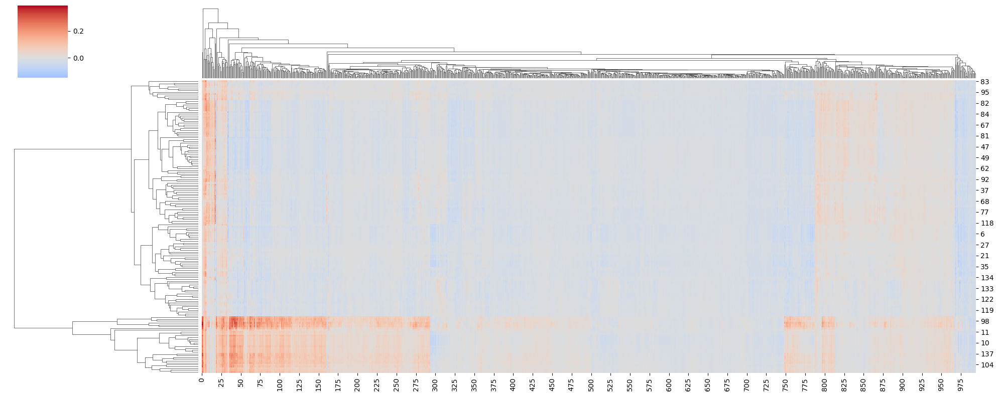

In [59]:
#now remove that tmiddle region, that's a good heatmap
#also, do a second heatmap that is celltype by accessibility, that way we can see if that region overall is more accessible, same order of clustering
#so it's just the same order and everything, same CREs, but coloro by accessibility
#let's just completely redo the plot, but this is a great plot! First up, let's remove that middle region
#for the accessibility, just load it in usin gthe multitasking model, use the mask to get the right ones of the 10k, then use train idx to find the actual idx

#first up tho, just removing the middle
row_order = g.dendrogram_row.reordered_ind
print(len(row_order)) #wait this is for the celltypes, let's do it instead for the cres
col_order = g.dendrogram_col.reordered_ind
print(len(col_order)) #this is the CREs, we have limited it to 1000, let's remove the middle, first find the middle

g = sns.clustermap(-temp.T,cmap='coolwarm', center=0, figsize=(20,8), vmin=vmin, vmax=vmax)
#now manualy set xticks and xticklabels to just be the order, don't care about what it originally was
g.ax_heatmap.set_xticks(np.arange(len(col_order), step=25))
#and assign the proper labels
g.ax_heatmap.set_xticklabels(range(0,1000,25))
#so let's remove 300 to 730

In [69]:
#now let's find what the indices of that original one are
remove_indices = np.array(col_order)[295:745]
print(remove_indices)
keep_indices = np.array(col_order)[np.setdiff1d(np.arange(len(col_order)),remove_indices)]
print(keep_indices)
# g2 = sns.clustermap(-temp[0:].T,cmap='coolwarm', center=0, figsize=(20,8), vmin=vmin, vmax=vmax)

[943 767 299 177 105 236  57 245 182  60 928 641 975  43 731 921 186 858
 580 644 122 969 932 966 179 376 206 107 283 526 812 231 567 733   9 698
 500 844 961 597 170 268 420 435 859 933 941 148 637  41 445  97 543 158
 485 510 509 864 700 360 736 601 682 717 828 977 877 971 114 386 956 103
 124 133 144 101 370 153 412 220 581 759 513  49 157 552  31 518 658  74
 851 870 571 657  33 616 745  47 940 401 202 109 483 357 452 477 458  18
 281 449 929 739 946  94 409 976 617 622 634 913 336 246 204 780 346 379
 612 804 872 683 197 121 402 725 210 746 577 591 679 674 990 525  63 265
  29 375 291 222 814  24 195 469  39 879 716 212 810 280 342 592 262 565
  40 521 690 349 480  70 719 318 382 180 722  12 599 239 808 737 691 139
 757 600 572 785  92 488 862 792 703 405 730 640 655 982 125 243 825 796
 512 589 598  14 754 831 610 659 315 993 431 479 741 906 685 912  71 978
 234 763 673 715 240 626  81 633 482 335 702 742 586 695 344 464 630 751
 986 793 433 686 635 883 841 629 704 720  44 129  4

In [50]:
temp.shape

(994, 161)

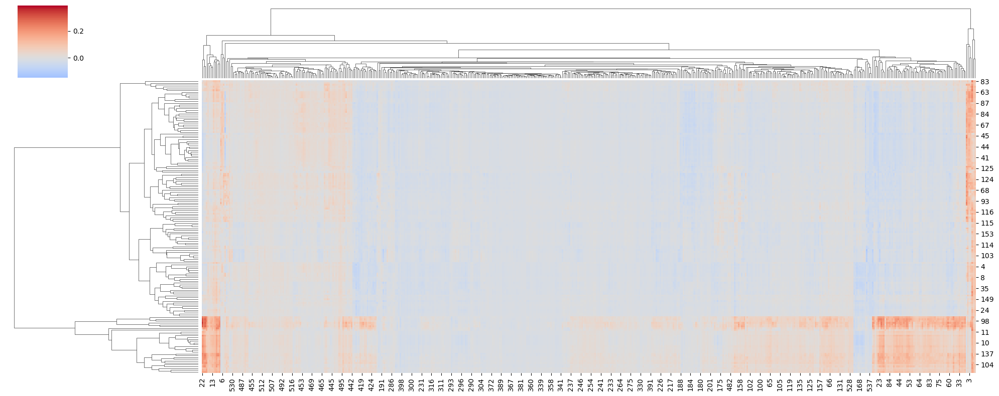

In [57]:
g2 = sns.clustermap(-temp[keep_indices].T,cmap='coolwarm', center=0, figsize=(20,8), vmin=vmin, vmax=vmax)

<Axes: >

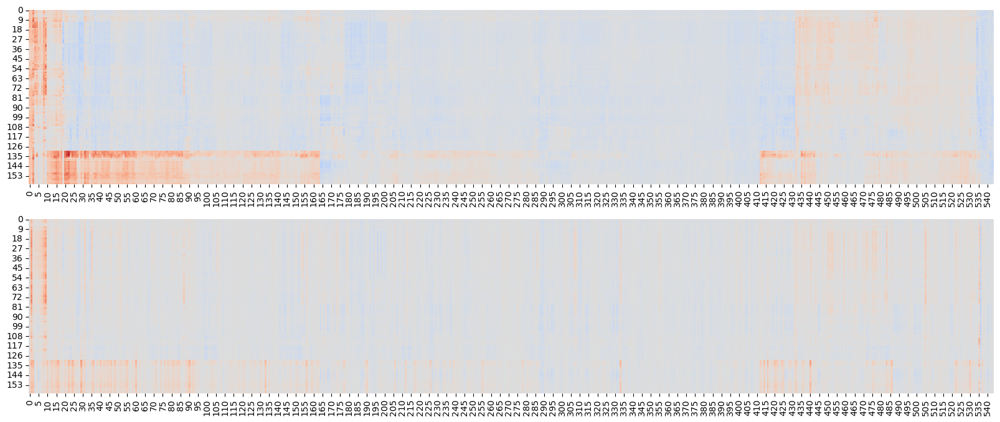

In [77]:
#so we have the order, let's just do a heatmap with the order of keep_indices
newtemp = temp[keep_indices]
newtemp = newtemp[:,row_order]
fig,ax = plt.subplots(2,1,figsize=(20,8))
newtemp2 = temp2[keep_indices]
newtemp2 = newtemp2[:,row_order]
vmax = -min(newtemp.min(), newtemp2.min())
vmin = -max(newtemp.max(), newtemp2.max())
sns.heatmap(-newtemp.T,cmap='coolwarm', center=0, vmin=vmin, vmax=vmax, ax = ax[0], cbar=None)
sns.heatmap(-newtemp2.T,cmap='coolwarm', center=0, vmin=vmin, vmax=vmax, ax = ax[1], cbar=None)

In [67]:
#tihs completely changes the order, what if we instead were to keep the order, but rermove those ones,
#so basically we just use the order from the original one, then we manually remove those indices, and then keep the rest of the order, that way when we plot
#the middle ones jsut aren't in the order list! That makes way more sense,no no need to recluster either!!
#then final step is get accessibility of this CRE!! 
#let's redefine keep_indices
keep_indices = np.concatenate([np.arange(295), np.arange(745,993)])
print(keep_indices.shape)

(543,)


<Axes: >

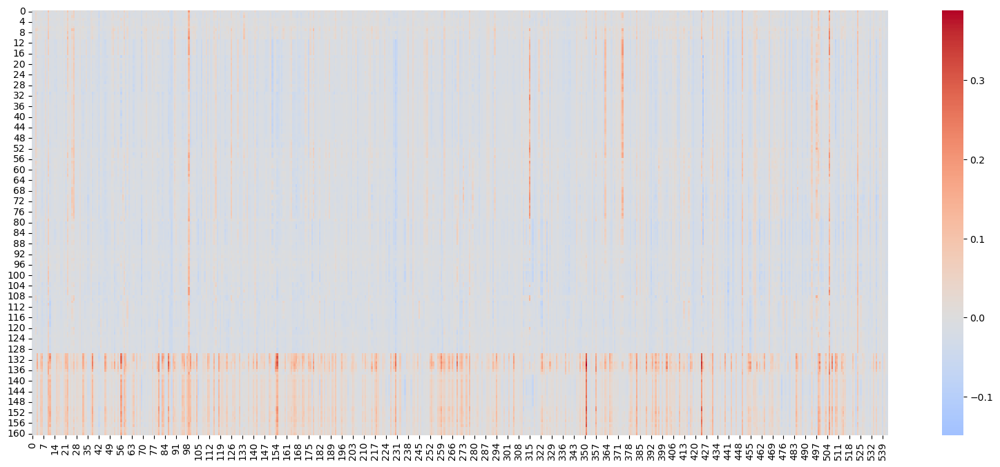

In [68]:
#so we have the order, let's just do a heatmap with the order of keep_indices
newtemp = temp[keep_indices]
newtemp = newtemp[:,row_order]
plt.figure(figsize=(20,8))
sns.heatmap(-newtemp.T,cmap='coolwarm', center=0, vmin=vmin, vmax=vmax)
#wait, this is wrong, use the above!

In [78]:
#no we clearly still need the order... hmmm I don't know what's wrong at all!
#now we make one that also includes accesibility!!

#so to get accessibility, we first need to find the actual indices this corresponds to
print(keep_indices)

[900 973 955 824 430 947 372 392 350 765 625 192 115  58 807 569 833  22
 881 358 326 421 325  11  38 426 432 773 484 959 175 389 387 611  64   3
 839 304 845  46 860  82 100 934 328 561 154 556 893 397 218 359 544 306
 396 118 755 960  32 338 904  15 131 400 172 183 150 614 502  98 624 689
 227 264 171 323  89  83 272  21 253  95 606 447 142  59 714 455 440 788
 849 254 102 300 377 462 645 692 369 474 147 244 169 209  78 237 865 602
 551 181 267 653 242 584 187 937 441  68 145 146 343 855 545 575 381 603
 541 217 160 782 233 528 830 587 352 322 752 970 643 496 710 391 398 425
 373 699 156 819 119 191 489 495 594 215  79 797 909 321 371 367 258 538
 867 493 711 925 943 299 177 236  57  60 641  43 731 921 186 580 969 932
 179 376 206 107 283 526 812 231 733 500 844 597 420 435 859 933 941 637
 445 543 158 510 864 700 360 601 717 828 877 114 103 124 144 370 153 412
 220 513  49 552  31 851 571  33 616 745  47 401 202 109 483 357 452 477
 449 739  94 976 634 913 336 204 780 612 872 683 19

In [80]:
#this is of the filtered data I think, but have to go from this to the mask, what if we just use the direct mask
temp = fimo_summary[:,466,:]
mask = np.abs(temp).sum(1) > 1.5
print(mask.shape, sum(mask))

(9999,) 994


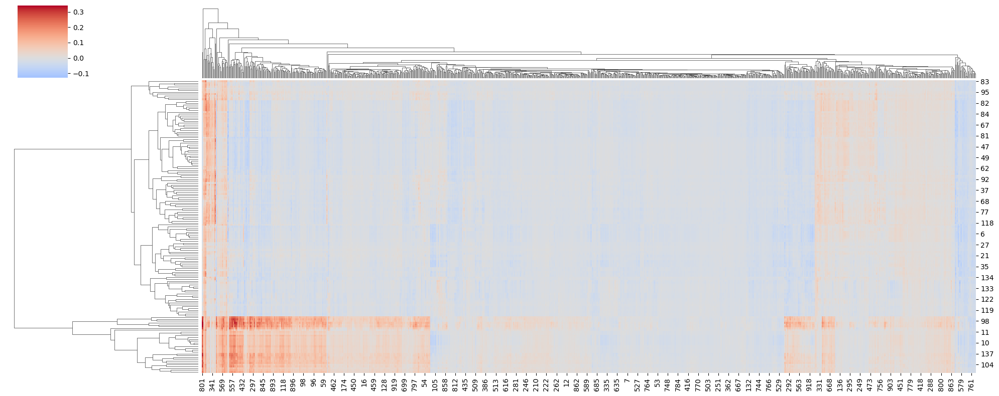

In [87]:
#we need the second mask that we define with keep indices
temp = fimo_summary[:,466,:]
mask = np.abs(temp).sum(1) > 1.5
temp = temp[mask]
g = sns.clustermap(-temp.T,cmap='coolwarm', center=0, figsize=(20,8), vmin=vmin, vmax=vmax)
col_order = g.dendrogram_col.reordered_ind

<Axes: >

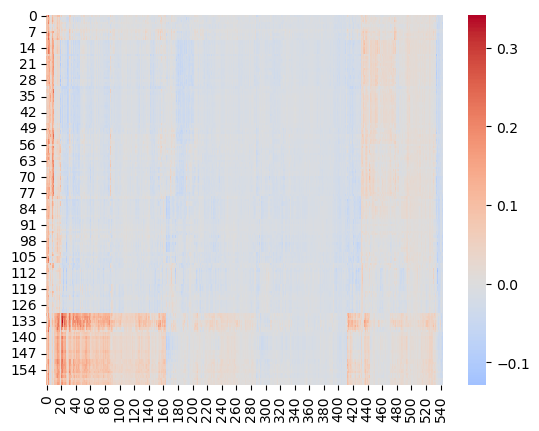

In [88]:
remove_indices = np.array(col_order)[295:745]
keep_indices = np.array(col_order)[np.setdiff1d(np.arange(len(col_order)),remove_indices)]
temp = temp[keep_indices]
temp = temp[:,row_order]
sns.heatmap(-temp.T,cmap='coolwarm', center=0, vmin=vmin, vmax=vmax)

In [90]:
#now we have our indices and what they corrrespond to, let's go ahead and just filter the full idx labels similarly
#we will have to somehow account for train vs test vs val, but hopefully it's not an issue at all
full_idxs = np.concatenate((train_idx,val_idx,test_idx))
train_labels = np.zeros(train_idx.shape[0], dtype=int)

val_labels = np.ones(val_idx.shape[0], dtype=int)
test_labels = np.full(test_idx.shape[0], 2, dtype=int)
full_labels = np.concatenate((train_labels, val_labels, test_labels))
result = np.vstack((full_idxs, full_labels)).T
print(result.shape)
print(result)

(9999, 2)
[[716808      0]
 [784800      0]
 [645332      0]
 ...
 [ 91467      2]
 [ 46985      2]
 [  3895      2]]


In [91]:
#now we have  what we need, let's apply the same mask technique
maskedresult = result[mask]
ordered_result = maskedresult[keep_indices]
print(ordered_result.shape)
print(ordered_result)

(544, 2)
[[757523      0]
 [616902      0]
 [616646      0]
 ...
 [616845      0]
 [744902      0]
 [674547      0]]


In [92]:
ordered_result.sum(0) #only 1 or 2 of them are test, let's find and can manually do this

array([296453072,         2])

In [94]:
ordered_result[ordered_result[:,1]!=0]

array([[61086,     2]])

In [95]:
#and now we can find which index that is
np.where(ordered_result[:,1] == 2) #it's 289

(array([289]),)

In [102]:
#now wecreate a for loop, with this loop, we can get a vector of accessibility values, still need to order by rows/celltypes
accessibility = np.zeros((keep_indices.shape[0], 161), dtype=np.float32)
print(accessibility.shape) #same as ordered_result
for i, idx in enumerate((ordered_result)):
    #now let's go ahead and load in the accessibility
    idx = int(idx[0])
    # print(idx)
    # break
    #now load it in
    labels = mult.dataset[idx][1][1]
    # print(labels) #definitely regression values!
    # print(labels.shape)
    # break
    #now we save it out
    accessibility[i] = labels

(544, 161)


In [104]:
print(np.abs(accessibility).min()) #not 0, so we're good!

5.3281125e-05


In [ ]:
#but of course one of the values is incorrect, it's the one for the test set
mult_test = ISMUtils('DNase_allcelltypes', multitasking_path1, classification=True, split='test')
accessibility[289] = mult_test.dataset[61086][1][1]
#now we have it properly!!

In [108]:
print(accessibility.shape)
print(temp.shape)

(544, 161)
(994, 161)


(544, 161) (544, 161) (544, 161)


<Axes: >

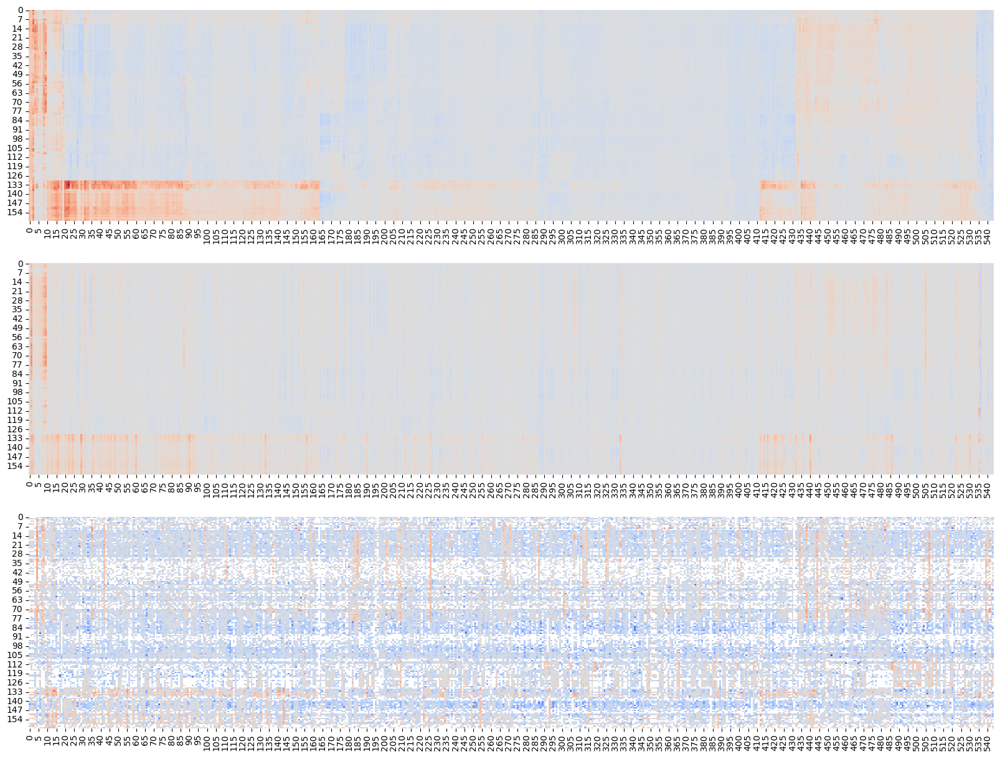

In [113]:
#have to order the rows still, but we can do that later
#we need the second mask that we define with keep indices
temp = fimo_summary[:,466,:]
temp2 = fimo_summary_mult[:,466,:]
mask = np.abs(temp).sum(1) > 1.5
temp = temp[mask]
temp2 = temp2[mask]
g = sns.clustermap(-temp.T,cmap='coolwarm', center=0, figsize=(20,8), vmin=vmin, vmax=vmax)
plt.close()
col_order = g.dendrogram_col.reordered_ind
remove_indices = np.array(col_order)[295:745]
keep_indices = np.array(col_order)[np.setdiff1d(np.arange(len(col_order)),remove_indices)]

newtemp = temp[keep_indices]
newtemp = newtemp[:,row_order]
fig,ax = plt.subplots(3,1,figsize=(20,15))
newtemp2 = temp2[keep_indices]
newtemp2 = newtemp2[:,row_order]
vmax = -min(newtemp.min(), newtemp2.min())
vmin = -max(newtemp.max(), newtemp2.max())
newaccessibility = accessibility[:,row_order]
newaccessibility = accessibility[:,row_order]
print(newtemp.shape, newtemp2.shape, newaccessibility.shape)
sns.heatmap(-newtemp.T,cmap='coolwarm', center=0, vmin=vmin, vmax=vmax, ax = ax[0], cbar=None)
sns.heatmap(-newtemp2.T,cmap='coolwarm', center=0, vmin=vmin, vmax=vmax, ax = ax[1], cbar=None)
sns.heatmap(newaccessibility.T,cmap='coolwarm', center=0, ax = ax[2], cbar=None, mask = newaccessibility.T==-10)

(544, 161) (544, 161) (544, 161)


<Axes: >

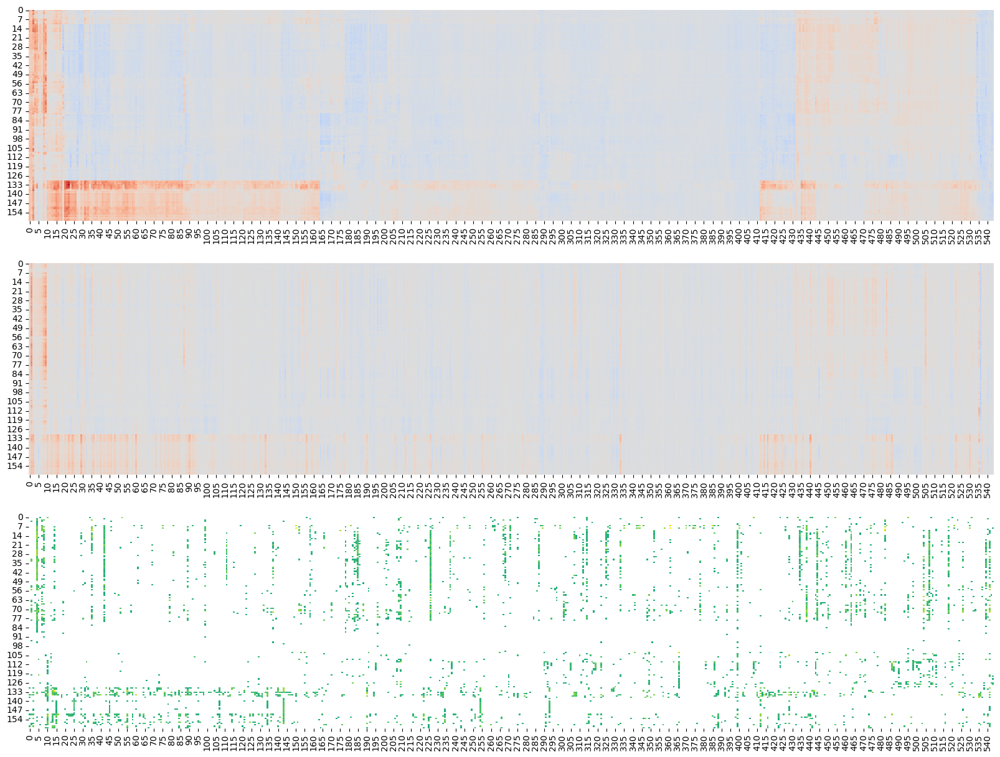

In [119]:
#have to order the rows still, but we can do that later
#we need the second mask that we define with keep indices
temp = fimo_summary[:,466,:]
temp2 = fimo_summary_mult[:,466,:]
mask = np.abs(temp).sum(1) > 1.5
temp = temp[mask]
temp2 = temp2[mask]
g = sns.clustermap(-temp.T,cmap='coolwarm', center=0, figsize=(20,8), vmin=vmin, vmax=vmax)
plt.close()
col_order = g.dendrogram_col.reordered_ind
remove_indices = np.array(col_order)[295:745]
keep_indices = np.array(col_order)[np.setdiff1d(np.arange(len(col_order)),remove_indices)]

newtemp = temp[keep_indices]
newtemp = newtemp[:,row_order]
fig,ax = plt.subplots(3,1,figsize=(20,15))
newtemp2 = temp2[keep_indices]
newtemp2 = newtemp2[:,row_order]
vmax = -min(newtemp.min(), newtemp2.min())
vmin = -max(newtemp.max(), newtemp2.max())
newaccessibility = accessibility[:,row_order]
newaccessibility = accessibility[:,row_order]
print(newtemp.shape, newtemp2.shape, newaccessibility.shape)
sns.heatmap(-newtemp.T,cmap='coolwarm', center=0, vmin=vmin, vmax=vmax, ax = ax[0], cbar=None)
sns.heatmap(-newtemp2.T,cmap='coolwarm', center=0, vmin=vmin, vmax=vmax, ax = ax[1], cbar=None)
sns.heatmap(newaccessibility.T,cmap='viridis', center=0, ax = ax[2], cbar=None, mask = newaccessibility.T<1)

(array([2.4727e+04, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 1.0000e+00, 0.0000e+00, 1.0000e+00, 1.0000e+00,
        2.0000e+00, 1.0000e+00, 5.0000e+00, 3.0000e+00, 4.0000e+00,
        7.0000e+00, 9.0000e+00, 6.0000e+00, 7.0000e+00, 1.9000e+01,
        1.6000e+01, 2.3000e+01, 2.1000e+01, 3.0000e+01, 4.2000e+01,
        4.3000e+01, 6.2000e+01, 5.4000e+01, 8.0000e+01, 7.9000e+01,
        1.0400e+02, 1.2500e+02, 1.6100e+02, 1.6800e+02, 2.3300e+02,
        2.6200e+02, 3.8400e+02, 4.2600e+02, 4.8800e+02, 6.1000e+02,
        7.5300e+02, 9.2300e+02, 1.1280e+03, 1.3670e+03, 1.6620e+03,
        1.9510e+03, 2.3830e+03, 2.8010e+03, 3.1360e+03, 3.6000e+03,
        3.8820e+03, 4.2020e+03, 4.5510e+03, 4.5640e+03, 4.1190e+03,
        3.5400e+03, 2.7840e+03, 2.3250e+03, 1.8750e+03, 1.4300e+03,
        1.0760e+03, 8.9900e+02, 6.5300e+02, 4.80

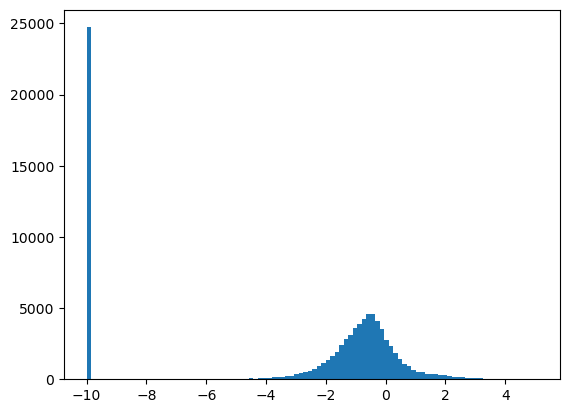

In [120]:
#find the 10 percentile or something, let's do a histogram to find this cutoff
plt.hist(newaccessibility.flatten(), bins = 100)

(544, 161) (544, 161) (544, 161)


<Axes: >

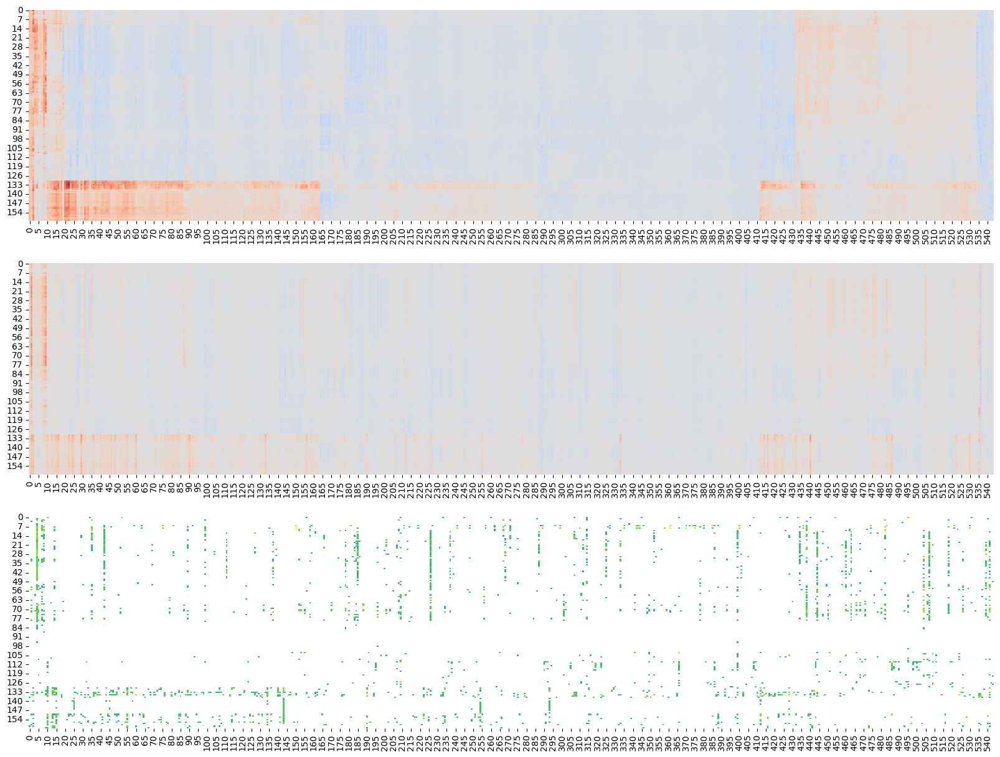

In [127]:
#have to order the rows still, but we can do that later
#we need the second mask that we define with keep indices
temp = fimo_summary[:,466,:]
temp2 = fimo_summary_mult[:,466,:]
mask = np.abs(temp).sum(1) > 1.5
temp = temp[mask]
temp2 = temp2[mask]
g = sns.clustermap(-temp.T,cmap='coolwarm', center=0, figsize=(20,8), vmin=vmin, vmax=vmax)
plt.close()
col_order = g.dendrogram_col.reordered_ind
remove_indices = np.array(col_order)[295:745]
keep_indices = np.array(col_order)[np.setdiff1d(np.arange(len(col_order)),remove_indices)]

newtemp = temp[keep_indices]
newtemp = newtemp[:,row_order]
fig,ax = plt.subplots(3,1,figsize=(20,15))
newtemp2 = temp2[keep_indices]
newtemp2 = newtemp2[:,row_order]
vmax = -min(newtemp.min(), newtemp2.min())
vmin = -max(newtemp.max(), newtemp2.max())
newaccessibility = accessibility[:,row_order]
newaccessibility = accessibility[:,row_order]
print(newtemp.shape, newtemp2.shape, newaccessibility.shape)
sns.heatmap(-newtemp.T,cmap='coolwarm', center=0, vmin=vmin, vmax=vmax, ax = ax[0], cbar=None)
sns.heatmap(-newtemp2.T,cmap='coolwarm', center=0, vmin=vmin, vmax=vmax, ax = ax[1], cbar=None)
sns.heatmap(newaccessibility.T,cmap='viridis', center=0, ax = ax[2], cbar=None, mask = newaccessibility.T<1.5)

(544, 161) (544, 161) (544, 161)


Text(0.5, 1.0, 'accessibility')

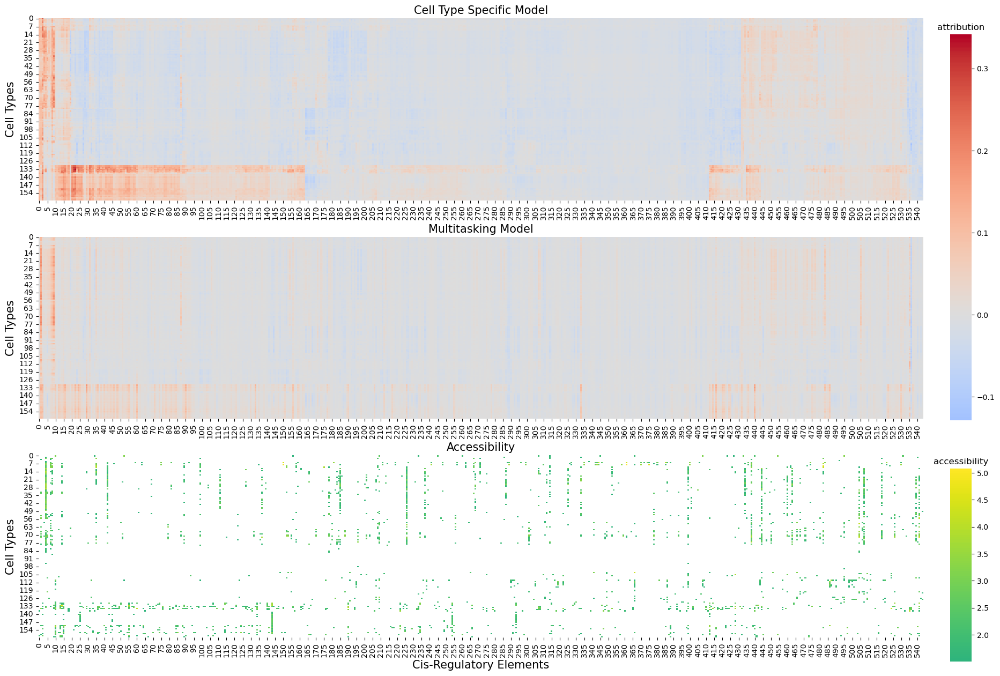

In [164]:
#have to order the rows still, but we can do that later
#we need the second mask that we define with keep indices
temp = fimo_summary[:,466,:]
temp2 = fimo_summary_mult[:,466,:]
mask = np.abs(temp).sum(1) > 1.5
temp = temp[mask]
temp2 = temp2[mask]
g = sns.clustermap(-temp.T,cmap='coolwarm', center=0, figsize=(20,8), vmin=vmin, vmax=vmax)
plt.close()
col_order = g.dendrogram_col.reordered_ind
remove_indices = np.array(col_order)[295:745]
keep_indices = np.array(col_order)[np.setdiff1d(np.arange(len(col_order)),remove_indices)]

newtemp = temp[keep_indices]
newtemp = newtemp[:,row_order]
fig,ax = plt.subplots(3,1,figsize=(20,15))
newtemp2 = temp2[keep_indices]
newtemp2 = newtemp2[:,row_order]
vmax = -min(newtemp.min(), newtemp2.min())
vmin = -max(newtemp.max(), newtemp2.max())
newaccessibility = accessibility[:,row_order]
newaccessibility = accessibility[:,row_order]
print(newtemp.shape, newtemp2.shape, newaccessibility.shape)
sns.heatmap(-newtemp.T,cmap='coolwarm', center=0, vmin=vmin, vmax=vmax, ax = ax[0], cbar=None)
plt.subplots_adjust(right=.95)
cbar_ax = fig.add_axes([0.975, 0.38, .02, 0.48])
cbar_ax2 = fig.add_axes([0.975, 0.08, .02, 0.24])
sns.heatmap(-newtemp2.T,cmap='coolwarm', center=0, vmin=vmin, vmax=vmax, ax = ax[1], cbar_ax = cbar_ax)
sns.heatmap(newaccessibility.T,cmap='viridis', center=0, ax = ax[2], cbar_ax=cbar_ax2, mask = newaccessibility.T<1.5)

#now let's label the x and y axes
fontsize = 15
ax[0].set_ylabel('Cell Types', fontsize=fontsize)
ax[1].set_ylabel('Cell Types',fontsize=fontsize)
ax[2].set_ylabel('Cell Types',fontsize=fontsize)
ax[2].set_xlabel('Cis-Regulatory Elements',fontsize=fontsize)
#and set the titles
ax[0].set_title('Cell Type Specific Model',fontsize=fontsize)
ax[1].set_title('Multitasking Model',fontsize=fontsize)
ax[2].set_title('Accessibility',fontsize=fontsize)
cbar_ax.set_title('attribution')
cbar_ax2.set_title('accessibility')

In [129]:
print(newtemp.shape)

(544, 161)


In [168]:
#let's correlate them together
from scipy.stats import pearsonr
correlations = np.zeros(544)
correlations_mult = np.zeros(544)
masked_accessibility = newaccessibility.copy()
masked_accessibility[newaccessibility < 1.5] = 0
for i in range(161):
    if masked_accessibility[:,i].sum() == 0 or newtemp[:,i].sum() == 0 or newtemp2[:,i].sum() == 0:
        continue
    correlations[i] = pearsonr(-newtemp[:,i],masked_accessibility[:,i])[0]
    correlations_mult[i] = pearsonr(-newtemp2[:,i],masked_accessibility[:,i])[0]
    if correlations[i] is np.nan:
        print('error')
        break
print(sum(correlations)/len(correlations))
print(sum(correlations_mult)/len(correlations_mult))
# print(correlations)


0.026095365013602816
0.021881064712064108


In [171]:
#let's do it across the celltypes instead of CREs
correlations = np.zeros(161)
correlations_mult = np.zeros(161)
for i in range(161):
    if masked_accessibility[i].sum() == 0 or newtemp[i].sum() == 0 or newtemp2[i].sum() == 0:
        continue
    correlations[i] = pearsonr(-newtemp[i],masked_accessibility[i])[0]
    correlations_mult[i] = pearsonr(-newtemp2[i],masked_accessibility[i])[0]
    if correlations[i] is np.nan:
        print('error')
        break
print(sum(correlations)/len(correlations))
print(sum(correlations_mult)/len(correlations_mult))

0.20127198836235272
0.18812641776044126


In [175]:
#correlation of that one region maybe?
#let's now just only do it for the last 35 celltypes
correlations = np.zeros(161)
correlations_mult = np.zeros(161)
for i in range(161-35,161):
    if masked_accessibility[i].sum() == 0 or newtemp[i].sum() == 0 or newtemp2[i].sum() == 0:
        continue
    correlations[i] = pearsonr(-newtemp[i],masked_accessibility[i])[0]
    correlations_mult[i] = pearsonr(-newtemp2[i],masked_accessibility[i])[0]
    if correlations[i] is np.nan:
        print('error')
        break
print(sum(correlations[161-35:])/len(correlations[161-35:]))
print(sum(correlations_mult[161-35:])/len(correlations_mult[161-35:]))
print(len(correlations[161-35:])) #yeah seems to be working I guess

0.1704060757124317
0.14286929143473723
35


In [181]:
print(masked_accessibility.shape, newtemp.shape,newtemp2.shape)
#ok so first index is the CRE, second is the celltype

(544, 161) (544, 161) (544, 161)


In [183]:
#let's actually take a step back and make sure it's correct
correlations = np.zeros(161)
correlations_mult = np.zeros(161)
for i in range(161):
    if masked_accessibility[:,i].sum() == 0 or newtemp[:,i].sum() == 0 or newtemp2[:,i].sum() == 0:
        continue
    correlations[i] = pearsonr(-newtemp[:,i],masked_accessibility[:,i])[0]
    correlations_mult[i] = pearsonr(-newtemp2[:,i],masked_accessibility[:,i])[0]
print(sum(correlations[:])/len(correlations[:]))
print(sum(correlations_mult[:])/len(correlations_mult[:]))
print(len(correlations[:])) #yeah seems to be working I guess

0.08817315880372628
0.07393353542461412
161


In [184]:
#now let's do it for every CRE
correlations = np.zeros(544)
correlations_mult = np.zeros(544)
for i in range(544):
    if masked_accessibility[i].sum() == 0 or newtemp[i].sum() == 0 or newtemp2[i].sum() == 0:
        continue
    correlations[i] = pearsonr(-newtemp[i],masked_accessibility[i])[0]
    correlations_mult[i] = pearsonr(-newtemp2[i],masked_accessibility[i])[0]
print(sum(correlations[:])/len(correlations[:]))
print(sum(correlations_mult[:])/len(correlations_mult[:]))
#ok this is also find it seems, nothing special tho

0.10489620166166182
0.10752356740155641


In [190]:
#yo we can't just use copoilot, this is like all wrong, let's delete and redo it
#so let's subset it to just look at the last 35 celltypes, just do this quickly
#and do the correlation across all the celltypes
correlations = np.zeros(35)
correlations_mult = np.zeros(35)
for i in range(161-35,161):
    # if masked_accessibility[i].sum() == 0 or newtemp[i].sum() == 0 or newtemp2[i].sum() == 0:
        # continue
    correlations[i-126] = pearsonr(-newtemp[:,i],masked_accessibility[:,i])[0]
    correlations_mult[i-126] = pearsonr(-newtemp2[:,i],masked_accessibility[:,i])[0]
print(sum(correlations[:])/len(correlations[:]))
print(sum(correlations_mult[:])/len(correlations_mult[:]))
#ok this is small, now let's do per CRE

0.10177365048033749
0.10648559399026315


In [191]:
correlations = np.zeros(544)
correlations_mult = np.zeros(544)
for i in range(544):
    if masked_accessibility[i].sum() == 0 or newtemp[i].sum() == 0 or newtemp2[i].sum() == 0:
        continue
    correlations[i] = pearsonr(-newtemp[i],masked_accessibility[i])[0]
    correlations_mult[i] = pearsonr(-newtemp2[i],masked_accessibility[i])[0]
print(sum(correlations[:])/len(correlations[:]))
print(sum(correlations_mult)/len(correlations_mult))
#ok it's like the same, idk if this is worth showing, basically the same

0.10489620166166182
0.10752356740155641


In [180]:
newtemp[i,:163].shape

(161,)

In [ ]:
#do correlation with accessibility across CREs andcelltypes, and make it a scatter plot, so each point is one motif and 2 scatter plots
#literally the same plot, but corerspondence of motif score across CREs and celltypes

#so literally the same plot I made with prediction, but using motif scores instead! This could make a lot more sense!
#shows how attributions are positively or negatively correlated! The issue of course being that we should mask it
#nah, let's just do it raw, not great, but it's ok, will show us something!

# correlation across CREs and celltypes with each motif as a point

let's think this through, basically, we have motif in every CRE and celltype, how do across just one? See this is not easy anymore!!



In [1]:
#let's go aheaad and just create the proper accessibility matrix since we'll need that for sure

#let's produce a figure quality heatmap comparing the models, then we can show these examples to show how it doesn't capture known motifs for B cells: SPI1
#we'll look at the GATA ones again
#let's try GATA 3
#let's load our saved file
import numpy as np
load = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_summary_bothmodel.npz')
fimo_summary,fimo_summary_mult = load['fimo_summary'], load['fimo_summary_mult']
print(fimo_summary.shape, fimo_summary_mult.shape)
import matplotlib.pyplot as plt
import seaborn as sns
#it is based on elements of train_idx, so to figure it out, load in train idx
#now let's plot it
from shap_analysis.ism_utils import *
multitasking_path1 = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-27/18-39-11-031863/checkpoints/25-val_loss=0.52186.ckpt' #the 25 epoch one
ctst_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-25/15-41-13-286486/checkpoints/last.ckpt'
mult = ISMUtils('DNase_allcelltypes', multitasking_path1, classification=True)
ctst = ISMUtils('DNase_ctst', ctst_path, classification=True)
mult_val = ISMUtils('DNase_allcelltypes', multitasking_path1, classification=True, split='val')
mult_test = ISMUtils('DNase_allcelltypes', multitasking_path1, classification=True, split='test')
#now have to load in the datafram to see where it is!
train_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/train_idx.npy')
val_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/val_idx.npy')
test_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/test_idx.npy')

#remove the 752763 index from train_idx
train_idx = train_idx[train_idx != 752763]

import polars as pl
fimo_results = pl.read_csv('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_motifs/fimo.tsv', separator = '\t')

fimo_results = fimo_results.drop(['motif_alt_id', 'string'])
fimo_results = fimo_results[:-3]

extra_pad = 5
all_motifs = fimo_results.group_by('motif_id').agg().sort('motif_id')
all_motifs = all_motifs.to_numpy()
motif_dict = {}
counter = 0
for motif in all_motifs:
    motif_dict[motif[0]] = counter
    counter += 1

(9999, 572, 161) (9999, 572, 161)


In [2]:
#now we create labels for train vs val vs test
label_train = np.zeros(train_idx.shape[0], dtype=int)
label_val = np.ones(val_idx.shape[0], dtype=int)
label_test = 2*np.ones(test_idx.shape[0], dtype=int)
labels = np.concatenate((label_train, label_val, label_test))
idxs = np.concatenate((train_idx,val_idx,test_idx))

#and combine them
result = np.vstack((idxs, labels)).T
print(result.shape)
print(result)

(9999, 2)
[[716808      0]
 [784800      0]
 [645332      0]
 ...
 [ 91467      2]
 [ 46985      2]
 [  3895      2]]


In [7]:
#now we create a for loop where we loop through it
#first define the labels
utils_list = [mult,mult_val,mult_test]
accessibility = np.zeros((9999,161))
for i, idx in enumerate(result):
    utils = utils_list[int(idx[1])]
    idx = int(idx[0])
    # print(utils)
    # break
    labels = utils.dataset[idx][1][1]
    accessibility[i] = labels
print(accessibility[-1])

[-1.12177446e-01  3.68109792e-01 -1.00000000e+01  1.40071058e+00
  1.61205602e+00  1.43646383e+00  2.03610420e+00 -1.36389524e-01
  1.30814207e+00 -7.24335611e-01  2.71246970e-01 -6.17966503e-02
 -7.06292391e-01 -2.67541176e-03  9.33880638e-03  6.05835319e-01
 -8.35908473e-01 -2.12971315e-01  5.16321361e-01 -4.40219253e-01
 -1.46607614e+00 -9.10037942e-03  7.46965647e-01 -1.00000000e+01
  4.66666281e-01  1.54591441e-01 -1.31210208e+00  7.46046305e-01
 -1.00000000e+01 -1.00000000e+01 -3.09508532e-01  5.59309423e-01
  1.54657340e+00  1.27263808e+00 -4.90656495e-01  1.46162897e-01
 -1.31681383e+00 -1.00000000e+01  1.98951554e+00  1.70117354e+00
  1.58604693e+00  1.79011166e+00 -1.00000000e+01  1.33398759e+00
 -1.00000000e+01  9.54798102e-01  4.86492664e-01  5.66558361e-01
 -1.00000000e+01 -1.00000000e+01 -1.00000000e+01 -8.29031944e-01
  3.45514059e-01 -7.44387150e-01 -8.66021931e-01 -1.00000000e+01
 -3.78349155e-01  2.53519106e+00  3.58009860e-02  1.54302406e+00
 -1.00000000e+01 -1.00000

In [15]:
#now with this, we have something to relate it with, the issue of course is that we dont'o have a tf dimension here, so what do we do
#maybe we just conglomerate it across all the CREs for that motif for every celltype
#I think thi approach makes sense
#so basically we get 572 points where we would get 1 before, but then we have 572*161 because 572 points for each celltype
#let's try it and plot it, this one should be the good one
from scipy.stats import spearmanr
correlations = np.zeros((fimo_summary.shape[1],fimo_summary.shape[2])) #572 x 161
correlations_mult = np.zeros(correlations.shape)
for i in range(fimo_summary.shape[1]):
    temp_matrix = -fimo_summary[:,i,:] #choose the motif and make it negative because you know, negative ISM means positive attribution means accessible
    temp_matrix_mult = -fimo_summary_mult[:,i,:]
    #now we have a corresponding matrix, this is great!
    # print(temp_matrix.shape) #it is indeed 9999 x 161
    # break
    #now we do the correlation for every celltype across CREs
    for j in range(temp_matrix.shape[1]):
        corr,pval = spearmanr(temp_matrix[:,j],accessibility[:,j]) #so once we 
        correlations[i,j] = corr
        corr,pval = spearmanr(temp_matrix_mult[:,j], accessibility[:,j])
        correlations_mult[i,j] = corr
    # break
# print(correlations[0])
# print(correlations_mult[0])

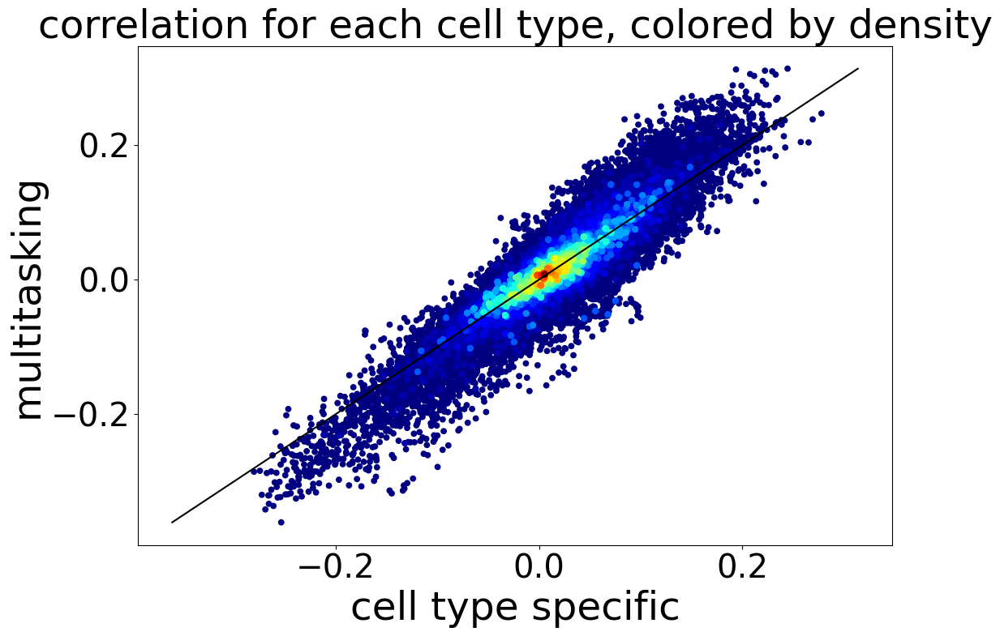

In [16]:
#and now we just plot every point, compare it to the other
x,y = np.array(correlations.flatten()), np.array(correlations_mult.flatten())
bins = [1000, 1000] # number of bins

# histogram the data
hh, locx, locy = np.histogram2d(x, y, bins=bins)

# Sort the points by density, so that the densest points are plotted last
z = np.array([hh[np.argmax(a<=locx[1:]),np.argmax(b<=locy[1:])] for a,b in zip(x,y)])
idx = z.argsort()
x2, y2, z2 = x[idx], y[idx], z[idx]

tempmin = np.min([np.min(x), np.min(y)])
tempmax = np.max([np.max(x), np.max(y)])

plt.figure(1,figsize=(12,8)).clf()
s = plt.scatter(x2, y2, c=z2, cmap='jet', marker='.', s=85)
plt.plot([tempmin, tempmax], [tempmin, tempmax], c='k')  
# plt.colorbar()
plt.xlabel('cell type specific', fontsize=35)
plt.ylabel('multitasking', fontsize=35)
plt.title('correlation for each cell type, colored by density', fontsize=35)
plt.tick_params(labelsize=29)

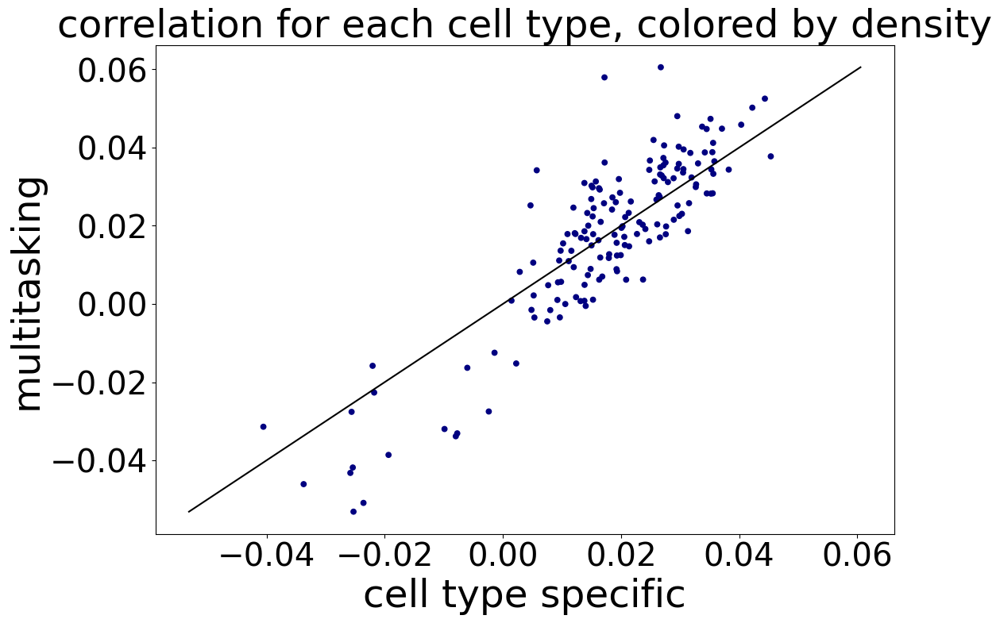

In [17]:
#the other approach is we average across the celltypes/CREs, so we can take the above and then just mean over the motif dimension
#so first do the mean over that and replot
x,y = np.array(correlations.mean(0)), np.array(correlations_mult.mean(0))
bins = [1000, 1000] # number of bins

# histogram the data
hh, locx, locy = np.histogram2d(x, y, bins=bins)

# Sort the points by density, so that the densest points are plotted last
z = np.array([hh[np.argmax(a<=locx[1:]),np.argmax(b<=locy[1:])] for a,b in zip(x,y)])
idx = z.argsort()
x2, y2, z2 = x[idx], y[idx], z[idx]

tempmin = np.min([np.min(x), np.min(y)])
tempmax = np.max([np.max(x), np.max(y)])

plt.figure(1,figsize=(12,8)).clf()
s = plt.scatter(x2, y2, c=z2, cmap='jet', marker='.', s=85)
plt.plot([tempmin, tempmax], [tempmin, tempmax], c='k')  
# plt.colorbar()
plt.xlabel('cell type specific', fontsize=35)
plt.ylabel('multitasking', fontsize=35)
plt.title('correlation for each cell type, colored by density', fontsize=35)
plt.tick_params(labelsize=29)

In [18]:
print(correlations[466].mean(), correlations_mult[466].mean())

0.021759378483390414 0.03354624267181319


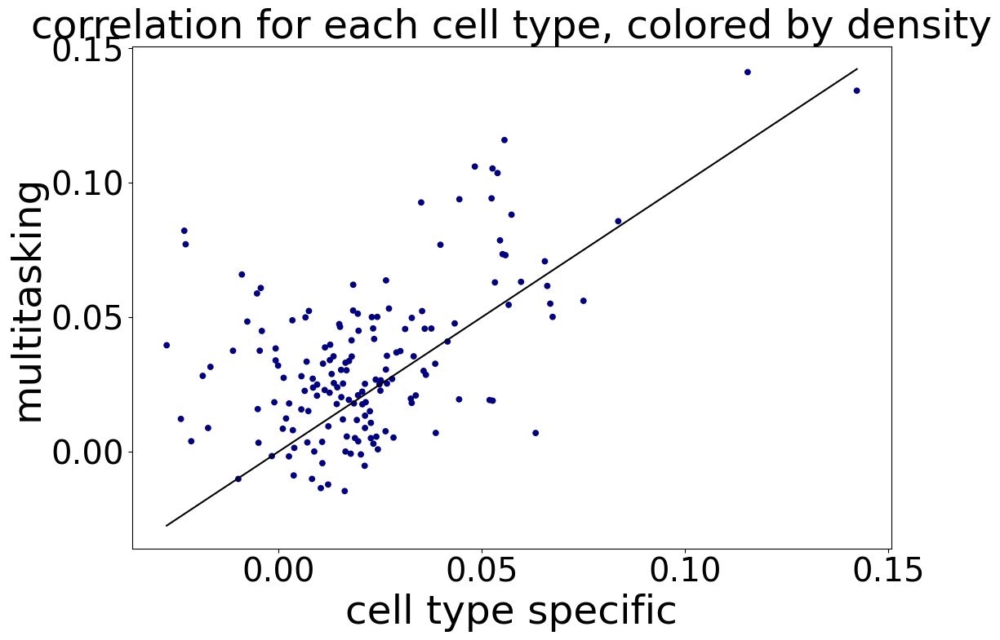

In [19]:
#now let's look at SPI1, would hope it's better!
x,y = np.array(correlations[466]), np.array(correlations_mult[466])
bins = [1000, 1000] # number of bins

# histogram the data
hh, locx, locy = np.histogram2d(x, y, bins=bins)

# Sort the points by density, so that the densest points are plotted last
z = np.array([hh[np.argmax(a<=locx[1:]),np.argmax(b<=locy[1:])] for a,b in zip(x,y)])
idx = z.argsort()
x2, y2, z2 = x[idx], y[idx], z[idx]

tempmin = np.min([np.min(x), np.min(y)])
tempmax = np.max([np.max(x), np.max(y)])

plt.figure(1,figsize=(12,8)).clf()
s = plt.scatter(x2, y2, c=z2, cmap='jet', marker='.', s=85)
plt.plot([tempmin, tempmax], [tempmin, tempmax], c='k')  
# plt.colorbar()
plt.xlabel('cell type specific', fontsize=35)
plt.ylabel('multitasking', fontsize=35)
plt.title('correlation for each cell type, colored by density', fontsize=35)
plt.tick_params(labelsize=29)

In [28]:
np.where((correlations.mean(0)>.04) & (correlations.mean(0)>correlations_mult.mean(0)))[0] #note and doesn't work here
#this is 

array([129])

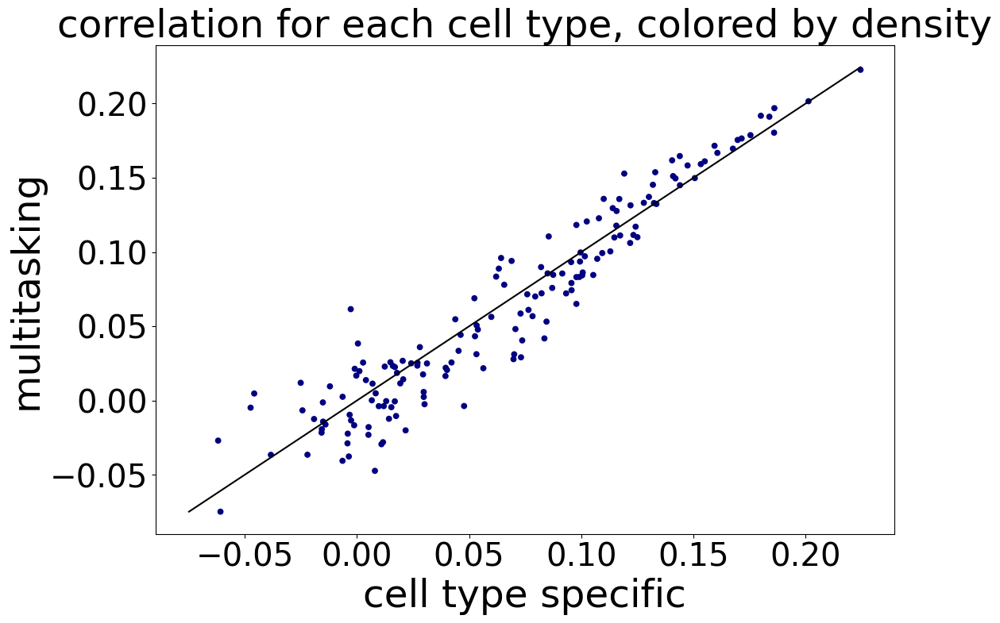

In [29]:
#let's look at that CRE, number 129!
#now let's look at SPI1, would hope it's better!
x,y = np.array(correlations[129]), np.array(correlations_mult[129])
bins = [1000, 1000] # number of bins

# histogram the data
hh, locx, locy = np.histogram2d(x, y, bins=bins)

# Sort the points by density, so that the densest points are plotted last
z = np.array([hh[np.argmax(a<=locx[1:]),np.argmax(b<=locy[1:])] for a,b in zip(x,y)])
idx = z.argsort()
x2, y2, z2 = x[idx], y[idx], z[idx]

tempmin = np.min([np.min(x), np.min(y)])
tempmax = np.max([np.max(x), np.max(y)])

plt.figure(1,figsize=(12,8)).clf()
s = plt.scatter(x2, y2, c=z2, cmap='jet', marker='.', s=85)
plt.plot([tempmin, tempmax], [tempmin, tempmax], c='k')  
# plt.colorbar()
plt.xlabel('cell type specific', fontsize=35)
plt.ylabel('multitasking', fontsize=35)
plt.title('correlation for each cell type, colored by density', fontsize=35)
plt.tick_params(labelsize=29)

In [30]:
#let's see which CRE it is
dict_keys = list(motif_dict.keys())
dict_keys[129]

'FOS_MA0476.1'

In [31]:
#let's do one more which is averaged over all the motifs, so first we collapse down our fimo summary across the 1st axis
averaged_fimo = fimo_summary.sum(1)
averaged_fimo_mult = fimo_summary_mult.sum(1)
print(averaged_fimo.shape)
print(averaged_fimo_mult.shape)

(9999, 161)
(9999, 161)


In [33]:
#now we can just do the basic correlation that we've done before
correlations_averaged = np.zeros(161)
correlations_averaged_mult = np.zeros(161)
for i in range(averaged_fimo.shape[1]):
    correlations_averaged[i] = spearmanr(-averaged_fimo[:,i], accessibility[:,i])[0]
    correlations_averaged_mult[i] = spearmanr(-averaged_fimo_mult[:,i], accessibility[:,i])[0]

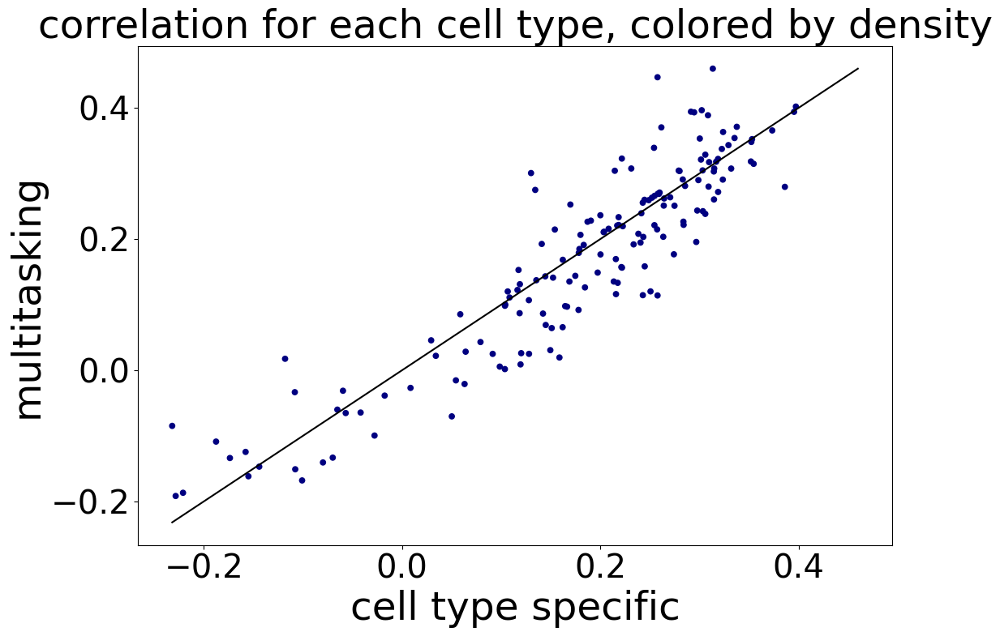

In [35]:
#let's look at that CRE, number 129!
#now let's look at SPI1, would hope it's better!
x,y = np.array(correlations_averaged), np.array(correlations_averaged_mult)
bins = [1000, 1000] # number of bins

# histogram the data
hh, locx, locy = np.histogram2d(x, y, bins=bins)

# Sort the points by density, so that the densest points are plotted last
z = np.array([hh[np.argmax(a<=locx[1:]),np.argmax(b<=locy[1:])] for a,b in zip(x,y)])
idx = z.argsort()
x2, y2, z2 = x[idx], y[idx], z[idx]

tempmin = np.min([np.min(x), np.min(y)])
tempmax = np.max([np.max(x), np.max(y)])

plt.figure(1,figsize=(12,8)).clf()
s = plt.scatter(x2, y2, c=z2, cmap='jet', marker='.', s=85)
plt.plot([tempmin, tempmax], [tempmin, tempmax], c='k')  
# plt.colorbar()
plt.xlabel('cell type specific', fontsize=35)
plt.ylabel('multitasking', fontsize=35)
plt.title('correlation for each cell type, colored by density', fontsize=35)
plt.tick_params(labelsize=29)

In [39]:
#now we can just do the basic correlation that we've done before
correlations_averaged = np.zeros(9999)
correlations_averaged_mult = np.zeros(9999)
for i in range(averaged_fimo.shape[0]):
    if accessibility[i].sum() == 0 or averaged_fimo[i].sum() == 0 or averaged_fimo_mult[i].sum() == 0:
        continue
    correlations_averaged[i] = spearmanr(-averaged_fimo[i], accessibility[i])[0]
    correlations_averaged_mult[i] = spearmanr(-averaged_fimo_mult[i], accessibility[i])[0]

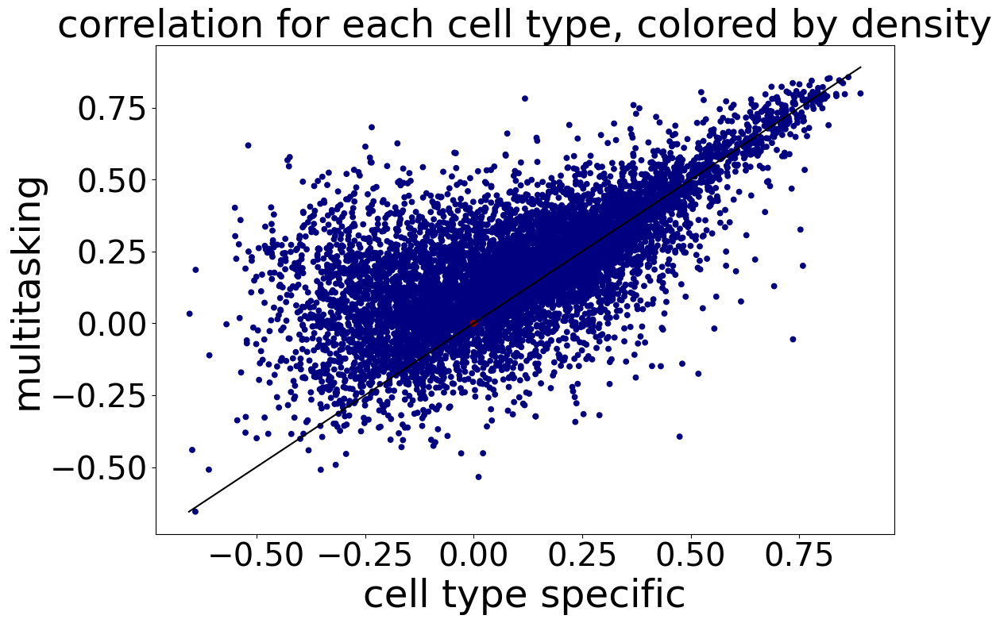

In [40]:
#let's look at that CRE, number 129!
#now let's look at SPI1, would hope it's better!
x,y = np.array(correlations_averaged), np.array(correlations_averaged_mult)
bins = [1000, 1000] # number of bins

# histogram the data
hh, locx, locy = np.histogram2d(x, y, bins=bins)

# Sort the points by density, so that the densest points are plotted last
z = np.array([hh[np.argmax(a<=locx[1:]),np.argmax(b<=locy[1:])] for a,b in zip(x,y)])
idx = z.argsort()
x2, y2, z2 = x[idx], y[idx], z[idx]

tempmin = np.min([np.min(x), np.min(y)])
tempmax = np.max([np.max(x), np.max(y)])

plt.figure(1,figsize=(12,8)).clf()
s = plt.scatter(x2, y2, c=z2, cmap='jet', marker='.', s=85)
plt.plot([tempmin, tempmax], [tempmin, tempmax], c='k')  
# plt.colorbar()
plt.xlabel('cell type specific', fontsize=35)
plt.ylabel('multitasking', fontsize=35)
plt.title('correlation for each cell type, colored by density', fontsize=35)
plt.tick_params(labelsize=29)

In [41]:
#let's try just positives and just negatives and absolute values
#now we can just do the basic correlation that we've done before
averaged_fimo = np.abs(fimo_summary).sum(1)
averaged_fimo_mult = np.abs(fimo_summary_mult).sum(1)
correlations_averaged = np.zeros(9999)
correlations_averaged_mult = np.zeros(9999)
for i in range(averaged_fimo.shape[0]):
    if accessibility[i].sum() == 0 or averaged_fimo[i].sum() == 0 or averaged_fimo_mult[i].sum() == 0:
        continue
    correlations_averaged[i] = spearmanr(-averaged_fimo[i], accessibility[i])[0]
    correlations_averaged_mult[i] = spearmanr(-averaged_fimo_mult[i], accessibility[i])[0]

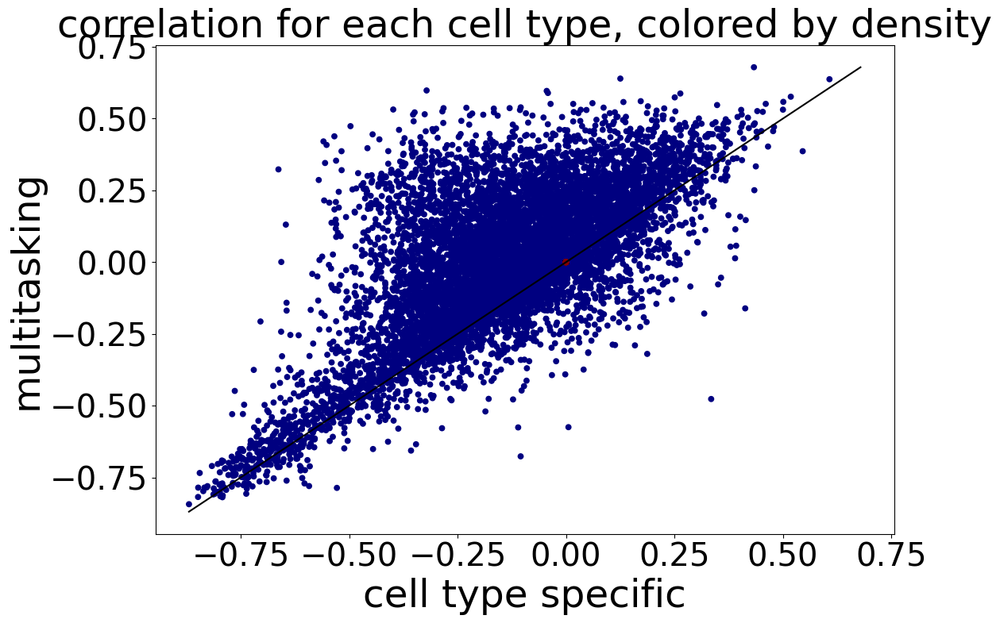

In [42]:
#let's look at that CRE, number 129!
#now let's look at SPI1, would hope it's better!
x,y = np.array(correlations_averaged), np.array(correlations_averaged_mult)
bins = [1000, 1000] # number of bins

# histogram the data
hh, locx, locy = np.histogram2d(x, y, bins=bins)

# Sort the points by density, so that the densest points are plotted last
z = np.array([hh[np.argmax(a<=locx[1:]),np.argmax(b<=locy[1:])] for a,b in zip(x,y)])
idx = z.argsort()
x2, y2, z2 = x[idx], y[idx], z[idx]

tempmin = np.min([np.min(x), np.min(y)])
tempmax = np.max([np.max(x), np.max(y)])

plt.figure(1,figsize=(12,8)).clf()
s = plt.scatter(x2, y2, c=z2, cmap='jet', marker='.', s=85)
plt.plot([tempmin, tempmax], [tempmin, tempmax], c='k')  
# plt.colorbar()
plt.xlabel('cell type specific', fontsize=35)
plt.ylabel('multitasking', fontsize=35)
plt.title('correlation for each cell type, colored by density', fontsize=35)
plt.tick_params(labelsize=29)

In [43]:
#let's ignore the closed regigons
#let's try just positives and just negatives and absolute values
#now we can just do the basic correlation that we've done before
averaged_fimo = np.abs(fimo_summary).sum(1)
averaged_fimo_mult = np.abs(fimo_summary_mult).sum(1)
correlations_averaged = np.zeros(9999)
correlations_averaged_mult = np.zeros(9999)
for i in range(averaged_fimo.shape[0]):
    if accessibility[i].sum() == 0 or averaged_fimo[i].sum() == 0 or averaged_fimo_mult[i].sum() == 0:
        continue
    mask = accessibility[i] != -10
    correlations_averaged[i] = spearmanr(-averaged_fimo[i][mask], accessibility[i][mask])[0]
    correlations_averaged_mult[i] = spearmanr(-averaged_fimo_mult[i][mask], accessibility[i][mask])[0]

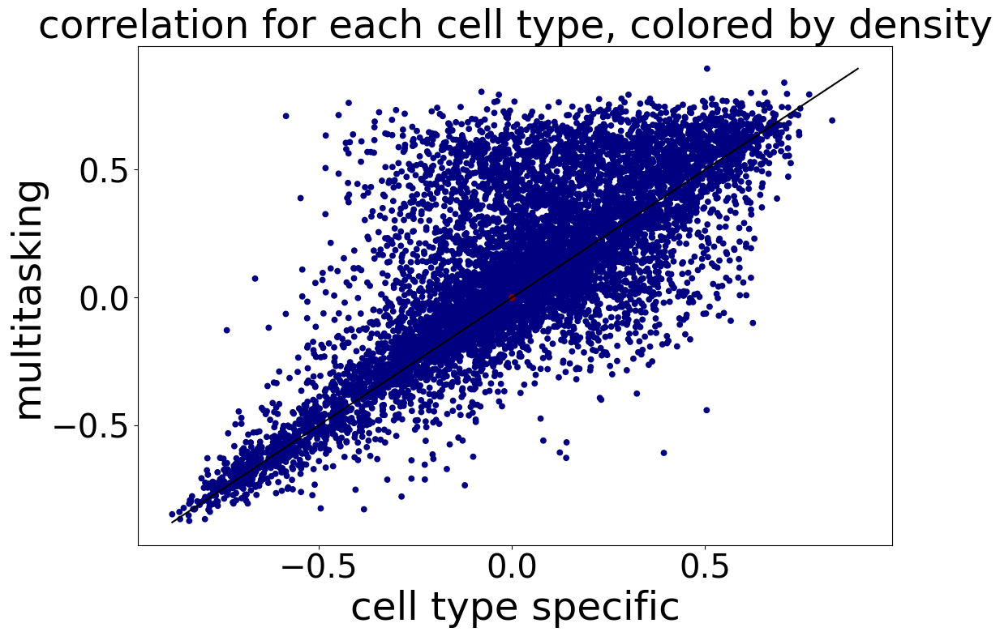

In [44]:
#let's look at that CRE, number 129!
#now let's look at SPI1, would hope it's better!
x,y = np.array(correlations_averaged), np.array(correlations_averaged_mult)
bins = [1000, 1000] # number of bins

# histogram the data
hh, locx, locy = np.histogram2d(x, y, bins=bins)

# Sort the points by density, so that the densest points are plotted last
z = np.array([hh[np.argmax(a<=locx[1:]),np.argmax(b<=locy[1:])] for a,b in zip(x,y)])
idx = z.argsort()
x2, y2, z2 = x[idx], y[idx], z[idx]

tempmin = np.min([np.min(x), np.min(y)])
tempmax = np.max([np.max(x), np.max(y)])

plt.figure(1,figsize=(12,8)).clf()
s = plt.scatter(x2, y2, c=z2, cmap='jet', marker='.', s=85)
plt.plot([tempmin, tempmax], [tempmin, tempmax], c='k')  
# plt.colorbar()
plt.xlabel('cell type specific', fontsize=35)
plt.ylabel('multitasking', fontsize=35)
plt.title('correlation for each cell type, colored by density', fontsize=35)
plt.tick_params(labelsize=29)

In [ ]:
#these results are definitely a bit sus, idk why it's better for multitasking, I think this correlation in general is quite sus!
#finally let's check to see if in our heatmap we get the same CRE motif we look at

# heatmap plot revisited

(544, 161) (544, 161) (544, 161)


Text(0.5, 1.0, 'accessibility')

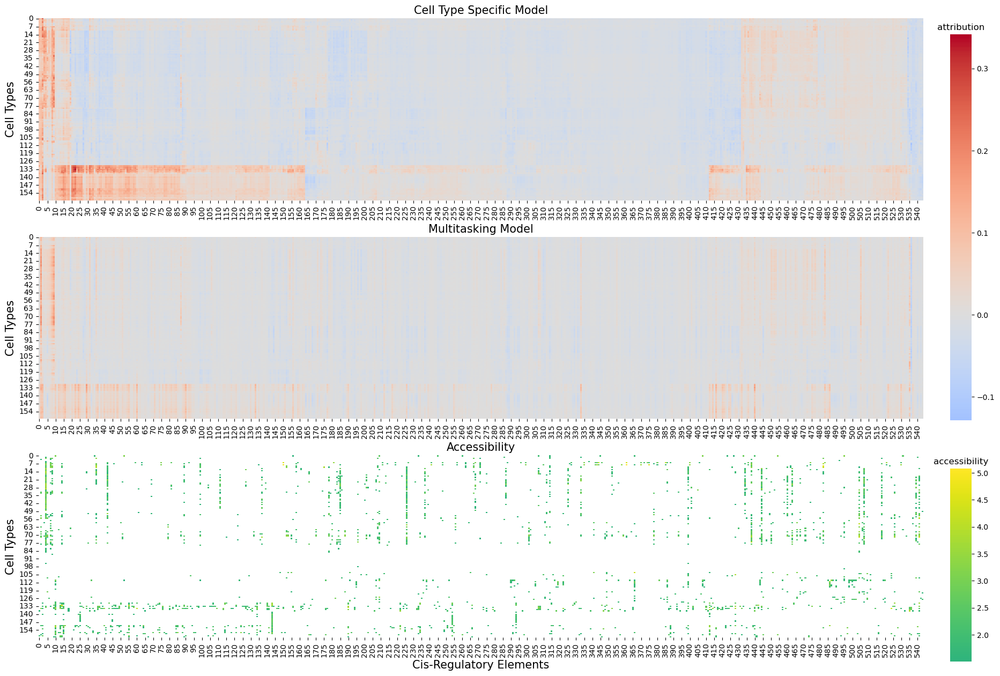

In [54]:
#have to order the rows still, but we can do that later
#we need the second mask that we define with keep indices
#now we have it properly!!

temp = fimo_summary[:,466,:]
temp2 = fimo_summary_mult[:,466,:]
full_idxs = np.concatenate((train_idx,val_idx,test_idx))

mask = np.abs(temp).sum(1) > 1.5
temp = temp[mask]
temp2 = temp2[mask]
g = sns.clustermap(-temp.T,cmap='coolwarm', center=0, figsize=(20,8))
plt.close()
col_order = g.dendrogram_col.reordered_ind
row_order = g.dendrogram_row.reordered_ind
remove_indices = np.array(col_order)[295:745]
keep_indices = np.array(col_order)[np.setdiff1d(np.arange(len(col_order)),remove_indices)]

maskedresult = full_idxs[mask]
ordered_result = maskedresult[keep_indices]
accessibility = np.zeros((keep_indices.shape[0], 161), dtype=np.float32)
for i, idx in enumerate((ordered_result)):
    # idx = int(idx[0])
    labels = mult.dataset[idx][1][1]
    accessibility[i] = labels
accessibility[289] = mult_test.dataset[61086][1][1]

newtemp = temp[keep_indices]
newtemp = newtemp[:,row_order]
fig,ax = plt.subplots(3,1,figsize=(20,15))
newtemp2 = temp2[keep_indices]
newtemp2 = newtemp2[:,row_order]
vmax = -min(newtemp.min(), newtemp2.min())
vmin = -max(newtemp.max(), newtemp2.max())
newaccessibility = accessibility[:,row_order]
newaccessibility = accessibility[:,row_order]
print(newtemp.shape, newtemp2.shape, newaccessibility.shape)
sns.heatmap(-newtemp.T,cmap='coolwarm', center=0, vmin=vmin, vmax=vmax, ax = ax[0], cbar=None)
plt.subplots_adjust(right=.95)
cbar_ax = fig.add_axes([0.975, 0.38, .02, 0.48])
cbar_ax2 = fig.add_axes([0.975, 0.08, .02, 0.24])
sns.heatmap(-newtemp2.T,cmap='coolwarm', center=0, vmin=vmin, vmax=vmax, ax = ax[1], cbar_ax = cbar_ax)
sns.heatmap(newaccessibility.T,cmap='viridis', center=0, ax = ax[2], cbar_ax=cbar_ax2, mask = newaccessibility.T<1.5)

#now let's label the x and y axes
fontsize = 15
ax[0].set_ylabel('Cell Types', fontsize=fontsize)
ax[1].set_ylabel('Cell Types',fontsize=fontsize)
ax[2].set_ylabel('Cell Types',fontsize=fontsize)
ax[2].set_xlabel('Cis-Regulatory Elements',fontsize=fontsize)
#and set the titles
ax[0].set_title('Cell Type Specific Model',fontsize=fontsize)
ax[1].set_title('Multitasking Model',fontsize=fontsize)
ax[2].set_title('Accessibility',fontsize=fontsize)
cbar_ax.set_title('attribution')
cbar_ax2.set_title('accessibility')

In [55]:
#now we are able to make our plot pretty, but more importantly, we can find if that one CRE that we used before is present
ordered_result

array([757523, 616902, 616646, 740997, 413834, 757722, 754129, 395611,
       382397, 830593,  40870, 834022, 125063, 602756,  40554, 504524,
       616740, 795266, 546611, 415494, 666207, 855974, 287134, 606978,
       782873,  94734, 783949, 847252, 686074, 616690, 763011, 585960,
       753950, 599309, 333311, 405077,  92801, 301475, 757782, 849997,
       616617, 606360, 286252, 757655, 606355, 693121, 634424, 805812,
       615612, 656230, 602493, 640501,  13078, 790437, 756543, 296412,
       818273, 757649, 519385, 713594, 757781, 783781, 231034,  36014,
       463479, 674421, 757851, 743420, 634553, 754100, 698030, 824604,
       769434, 686423, 457929, 429523, 200901, 744285, 817048, 743461,
       329166, 698177, 669193, 787018,  55411, 376690, 681000, 830472,
       120283,  41445, 757786, 151215, 712487, 803110, 746684, 692957,
       625378, 747497, 837073, 606919, 687978, 774294, 458750, 419253,
        50094, 820855, 824617, 706778, 315902, 756293, 710017, 601603,
      

In [57]:
#that is the list of indices, what we want to do is look for that one great value! Let's find it and then see if the corresponding train_idx is in here!
#so if we do thsi below code it's 891
'''
temp = fimo_summary[:,466,:]
#and plot
temp = temp[temp.sum(1) != 0]
'''

#let's define a tempmask and apply it to the full_idxs
temp = fimo_summary[:,466,:]
temp_mask = temp.sum(1) !=0
#now let's print it
print(temp_mask.shape)
masked_idxs = full_idxs[temp_mask]
print(masked_idxs.shape)
print(masked_idxs[891])

(9999,)
(2723,)
301475


In [59]:
np.where(ordered_result==301475) #oh thank god!

(array([37]),)